# 1. Import & Config

In [1]:
import sys, os, json
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
from torch.utils.data import Dataset, DataLoader
# from scipy.stats import gaussian_kde

from entities import Portfolio  # ปรับ import ตาม path จริง
from config import InferenceConfig, DDPMTransformerConfig
from utils import setup_logging, setup_random_seed, load_variant, inverse_x, simulate_mc_gbm, make_all_dataloaders
from utils.paths import PROCESSED_DIR, EXPERIMENTS_DIR

logger = setup_logging()
logger.info("✓ Imports OK")

2026-05-28 23:27:11,963 - utils.setup - INFO - Logger is set up.
2026-05-28 23:27:11,964 - utils.setup - INFO - ✓ Imports OK


## 1.1 Config

In [2]:
inf_cfg = InferenceConfig(
    name              = "v3_portfolio_01",
    group             = "",
    description       = "Portfolio analysis from simulation outputs",

    processed_dir     = Path(PROCESSED_DIR),
    experiments_dir   = Path(EXPERIMENTS_DIR),

    experiment_name   = "v1_trial04_ddpm_warmup-cosine_w20_d20_seqWA_featDC_robust_standard",
    # experiment_name   = "v1_trial04_ddpm_warmup-cosine_w30_d20_seqWA_featDC_robust_standard",
    simulation_name   = "n100_simulations_independent_windows_rand256",
    checkpoint_file   = "epoch_1000.pt",

    num_simulations   = 100,
    random_seed       = 42,
)

setup_random_seed(inf_cfg.random_seed)

print("=" * 60)
print("  V3-4 PORTFOLIO")
print("=" * 60)
print(f"  Experiment      : {inf_cfg.experiment_name}")
print(f"  Simulation      : {inf_cfg.simulation_name}")
print(f"  Simulation dir  : {inf_cfg.simulation_dir}")
print("=" * 60)

  V3-4 PORTFOLIO
  Experiment      : v1_trial04_ddpm_warmup-cosine_w20_d20_seqWA_featDC_robust_standard
  Simulation      : n100_simulations_independent_windows_rand256
  Simulation dir  : /home/narodom.y@FUSION.LAB/research/02_experiments/v1_trial04_ddpm_warmup-cosine_w20_d20_seqWA_featDC_robust_standard/simulations/n100_simulations_independent_windows_rand256


# 2. Load Simulation Data

## 2.1 SimulationDataset

โหลดจาก `.npz` ที่ save ไว้ใน `sim_dir` ของ V3-3  
แต่ละ file = 1 test window ประกอบด้วย:

| key | shape | description |
|---|---|---|
| `x_gen` | `(N, A, W, D, C)` | generated log-returns (N sims) |
| `x_real` | `(A, W, D, C)` | real log-returns |
| `log_returns` | `(N, A, W, C)` | decoded log-returns |
| `prices` | `(N, A, W, C)` | decoded prices |
| `init_price` | `(A,)` | initial price ของ window |
| `dates` | `(W,)` | timestamps ของแต่ละ window step |
| `init_date` | scalar | timestamp เริ่มต้น window |
| `ohlcv` | `(A, W, D, C)` | raw OHLCV real data |

In [3]:
import glob

class SimulationDataset(Dataset):
    def __init__(self, sim_dir: Path):
        self.sim_dir = Path(sim_dir)
        with open(self.sim_dir / "meta.json") as f:
            self.meta = json.load(f)

        # นับจาก file จริง ไม่เชื่อ meta
        self.n = len(sorted(self.sim_dir.glob("batch_*.npz")))

    def __len__(self):
        return self.n

    def __getitem__(self, idx):
        raw = np.load(self.sim_dir / f"batch_{idx:03d}.npz")
        return {k: raw[k] for k in raw.files}

    def __repr__(self):
        return (f"SimulationDataset(n_windows={self.n}, "
                f"n_sims={self.meta['num_simulations']}, "
                f"symbols={len(self.meta['symbols'])})")

## 2.2 Load & Inspect

In [4]:
sim_dir = inf_cfg.simulation_dir
dataset = SimulationDataset(sim_dir)
print(dataset)

# meta summary
meta = dataset.meta
SYMBOLS     = meta["symbols"]
N_SIMS      = meta["num_simulations"]
# N_WINDOWS   = meta["n_windows"]
N_WINDOWS = dataset.n
N_ASSETS    = len(SYMBOLS)

print(f"\n  symbols      : {SYMBOLS}")
print(f"  n_windows    : {N_WINDOWS}")
print(f"  n_sims       : {N_SIMS}")
print(f"  created_at   : {meta['created_at']}")

SimulationDataset(n_windows=46, n_sims=100, symbols=16)

  symbols      : ['AAPL', 'AMZN', 'CAT', 'EEM', 'GOOGL', 'JNJ', 'JPM', 'KO', 'META', 'MSFT', 'NVDA', 'SPY', 'TLT', 'TSLA', 'GLD', 'XOM']
  n_windows    : 46
  n_sims       : 100
  created_at   : 2026-05-28T15:59:52.515184+00:00


## 2.3 Shape Check

In [5]:
# peek at first window
sample = dataset[0]

print(f"{'key':<16} {'shape':<30} dtype")
print("─" * 60)
for k, v in sample.items():
    arr = np.array(v)
    print(f"  {k:<14} {str(arr.shape):<30} {arr.dtype}")

key              shape                          dtype
────────────────────────────────────────────────────────────
  x_gen          (100, 16, 20, 20, 4)           float32
  x_real         (16, 20, 20, 4)                float32
  cond           (16, 20, 11)                   float32
  init_price     (16,)                          float32
  init_date      ()                             int64
  dates          (20,)                          int64
  ohlcv          (16, 20, 4)                    float32
  log_returns    (100, 16, 20, 20, 4)           float32
  prices         (100, 16, 20, 20)              float32


## 2.4 Load All Windows into Memory

In [6]:
# โหลดทั้งหมดเข้า memory (สะดวกถ้า dataset ไม่ใหญ่มาก)
# ถ้า dataset ใหญ่ → ใช้ DataLoader แทน

all_windows = [dataset[i] for i in range(N_WINDOWS)]
print(f"  ✓ loaded {len(all_windows)} windows")

# ── ตัวอย่าง: ใช้ DataLoader ─────────────────────────────────────────
# loader = DataLoader(dataset, batch_size=1, shuffle=False)
# for batch in loader:
#     x_gen      = batch["x_gen"]      # (1, N, A, W, D, C)
#     prices     = batch["prices"]     # (1, N, A, W, C)
#     init_price = batch["init_price"] # (1, A)
#     ...

# ── ตัวอย่าง: stack arrays ────────────────────────────────────────────
# prices shape per window: (N, A, W, C) → stack → (T_windows, N, A, W, C)
all_prices     = np.stack([w["prices"]      for w in all_windows])  # (T, N, A, W, C)
all_log_ret    = np.stack([w["log_returns"] for w in all_windows])  # (T, N, A, W, C)
all_init_price = np.stack([w["init_price"]  for w in all_windows])  # (T, A)
all_dates      = np.stack([w["dates"]       for w in all_windows])  # (T, W)

print(f"  all_prices     : {all_prices.shape}")
print(f"  all_log_ret    : {all_log_ret.shape}")
print(f"  all_init_price : {all_init_price.shape}")
print(f"  all_dates      : {all_dates.shape}")

  ✓ loaded 46 windows
  all_prices     : (46, 100, 16, 20, 20)
  all_log_ret    : (46, 100, 16, 20, 20, 4)
  all_init_price : (46, 16)
  all_dates      : (46, 20)


In [7]:
for w in all_windows:
    print(w["prices"].shape)

(100, 16, 20, 20)
(100, 16, 20, 20)
(100, 16, 20, 20)
(100, 16, 20, 20)
(100, 16, 20, 20)
(100, 16, 20, 20)
(100, 16, 20, 20)
(100, 16, 20, 20)
(100, 16, 20, 20)
(100, 16, 20, 20)
(100, 16, 20, 20)
(100, 16, 20, 20)
(100, 16, 20, 20)
(100, 16, 20, 20)
(100, 16, 20, 20)
(100, 16, 20, 20)
(100, 16, 20, 20)
(100, 16, 20, 20)
(100, 16, 20, 20)
(100, 16, 20, 20)
(100, 16, 20, 20)
(100, 16, 20, 20)
(100, 16, 20, 20)
(100, 16, 20, 20)
(100, 16, 20, 20)
(100, 16, 20, 20)
(100, 16, 20, 20)
(100, 16, 20, 20)
(100, 16, 20, 20)
(100, 16, 20, 20)
(100, 16, 20, 20)
(100, 16, 20, 20)
(100, 16, 20, 20)
(100, 16, 20, 20)
(100, 16, 20, 20)
(100, 16, 20, 20)
(100, 16, 20, 20)
(100, 16, 20, 20)
(100, 16, 20, 20)
(100, 16, 20, 20)
(100, 16, 20, 20)
(100, 16, 20, 20)
(100, 16, 20, 20)
(100, 16, 20, 20)
(100, 16, 20, 20)
(100, 16, 20, 20)


## 2.5 Load Feature Store

In [8]:
feature_name, feature_variant = inf_cfg.load_feature_store_info()
_, scalers = load_variant(inf_cfg.processed_dir, feature_name, feature_variant)
x_scaler = scalers["x"]

print(f"  feature_store : {feature_name} / {feature_variant}")
print(f"  ✓ x_scaler loaded")

  feature_store : v1_trial04_w20_d20_asset16 / robust_standard
  ✓ x_scaler loaded


In [9]:
feature_name, feature_variant = inf_cfg.load_feature_store_info()
batch_sizes = inf_cfg.load_batch_sizes()

data, scalers = load_variant(
    inf_cfg.processed_dir,
    feature_name,
    feature_variant,
)
loaders = make_all_dataloaders(
    inf_cfg.processed_dir,
    feature_name,
    feature_variant,
    batch_sizes=batch_sizes,
)

with open(inf_cfg.processed_dir / f"{feature_name}_{feature_variant}" / "meta.json") as f:
    meta = json.load(f)

SYMBOLS    = meta["cfg"]["symbols"]
x_scaler   = scalers["x"]
cond_scaler = scalers["cond"]

print("✓ Feature store loaded")

✓ Feature store loaded


In [10]:
for split in ["train", "val", "test"]:
    x    = data[split]["x"]
    cond = data[split]["cond"]
    print(f"  {split:<6}  x={str(x.shape):<28} cond={str(cond.shape):<22} n_windows={x.shape[0]}")

  train   x=(1341, 16, 20, 20, 4)        cond=(1341, 16, 20, 11)     n_windows=1341
  val     x=(934, 16, 20, 20, 4)         cond=(934, 16, 20, 11)      n_windows=934
  test    x=(46, 16, 20, 20, 4)          cond=(46, 16, 20, 11)       n_windows=46


In [11]:
import torch

# scaled log returns to unscaled log returns
def decode_to_log_returns(
    x: torch.Tensor,
    x_scaler,
):
    x_np = x.cpu().numpy()

    # Reshape to 2D for inverse scaling:
    original_shape = x_np.shape
    x_np_reshaped = x_np.reshape(-1, x_np.shape[-1])

    log_returns = inverse_x(x_np_reshaped, x_scaler)
    log_returns = log_returns.reshape(original_shape)

    return log_returns

In [12]:
def load_gt_windows_from_loader(loader, x_scaler) -> list[dict]:
    gt_windows = []
    for batch in loader:
        x_w, _, init_price_w, ohlcv_w, dates_w, init_date_w = batch

        lr = decode_to_log_returns(x_w.squeeze(0), x_scaler)  # (A, W, D, C)
        gt_log_returns = lr[:, :, 0, 0].T          # (W, A) — D=0, C=0 = close log return
        gt_prices      = ohlcv_w.squeeze(0).cpu().numpy()[:, :, 3].T  # (W, A) — C=3 = close price

        gt_windows.append({
            "log_returns" : gt_log_returns,
            "prices"      : gt_prices,
            "dates"       : dates_w.squeeze(0).cpu().numpy(),
        })
    return gt_windows

gt_windows = load_gt_windows_from_loader(loaders["test"], x_scaler)

# assert len(gt_windows) == len(all_windows)
for i in range(3):
    d_gt  = pd.to_datetime(gt_windows[i]["dates"][0],  unit="ns" if gt_windows[i]["dates"][0]  > 1e15 else "ms")
    d_sim = pd.to_datetime(all_windows[i]["dates"][0], unit="ns" if all_windows[i]["dates"][0] > 1e15 else "ms")
    print(f"window {i:02d}  gt={d_gt.date()}  sim={d_sim.date()}  match={d_gt==d_sim}")

window 00  gt=2022-04-01  sim=2022-04-01  match=True
window 01  gt=2022-05-02  sim=2022-05-02  match=True
window 02  gt=2022-05-31  sim=2022-05-31  match=True


# 3.

In [13]:

CLOSE_IDX = 3  # ohlcv channel: 0=open, 1=high, 2=low, 3=close

# ── gt_returns & gt_prices ────────────────────────────────────────────
# ohlcv shape per window: (A, W, D, C) → เอา close channel
# all_windows[t]["ohlcv"] : (A, W, D=20, C=4) → close: (A, W, D)
# flatten W×D → (A, W*D) → transpose → (W*D, A) = (n_periods, A)

def prepare_gt(windows: list[dict], c_idx: int = 0):
    gt_price_list = []
    for w in windows:
        ohlcv = w["ohlcv"]              # (A, W, C) — C=4: o/h/l/c
        close = ohlcv[:, :, c_idx]     # (A, W)
        gt_price_list.append(close.T)  # (W, A)

    gt_prices  = np.concatenate(gt_price_list, axis=0)
    gt_returns = np.diff(np.log(gt_prices + 1e-8), axis=0)
    gt_prices  = gt_prices[1:]
    return gt_returns, gt_prices


# ── mc_returns ────────────────────────────────────────────────────────
# log_returns shape per window: (N, A, W, D, C) → close: (N, A, W, D)
# flatten W×D → (N, A, W*D) → transpose axes → (N, W*D, A) = (N, n_periods, A)

def prepare_mc(windows: list[dict], d_idx: int = 0, c_idx: int = 0):
    mc_list = []
    for w in windows:
        lr = w["log_returns"]           # (N, A, W, D, C)
        step = lr[:, :, :, d_idx, c_idx]  # (N, A, W) — เอาแค่ D=0, C=0
        flat = step.transpose(0, 2, 1)    # (N, W, A) = (N, n_periods, A)
        mc_list.append(flat)

    return np.concatenate(mc_list, axis=1)  # (N, n_periods_total, A)


gt_returns, gt_prices = prepare_gt(all_windows)
mc_returns            = prepare_mc(all_windows)

print(f"  gt_returns  : {gt_returns.shape}   (n_periods, n_assets)")
print(f"  gt_prices   : {gt_prices.shape}   (n_periods, n_assets)")
print(f"  mc_returns  : {mc_returns.shape}  (n_sims, n_periods, n_assets)")

  gt_returns  : (919, 16)   (n_periods, n_assets)
  gt_prices   : (919, 16)   (n_periods, n_assets)
  mc_returns  : (100, 920, 16)  (n_sims, n_periods, n_assets)


In [14]:
flat_dates  = np.sort(all_dates.flatten())
unit        = "ns" if flat_dates[0] > 1e15 else "ms"
date_index  = pd.to_datetime(flat_dates, unit=unit).drop_duplicates().sort_values()[1:]
start_date  = date_index[0].date()
end_date    = date_index[-1].date()

print(f"start_date: {start_date}, end_date: {end_date}, n_dates: {len(date_index)}")

start_date: 2022-04-04, end_date: 2025-12-01, n_dates: 919


In [15]:
def get_historical_returns_before(all_windows, current_idx, lookback_windows=2, c_idx=3):
    """
    เอา close prices จาก windows ก่อนหน้า แล้ว calc log returns
    ใช้เป็น historical data สำหรับ fit GBM (ไม่รู้อนาคต)
    """
    if current_idx == 0:
        # window แรก — ไม่มี history → return None (จะ fallback equal-weight หรือ skip)
        return None

    start = max(0, current_idx - lookback_windows)
    hist_windows = all_windows[start:current_idx]  # windows ก่อนหน้าเท่านั้น

    # ต่อ close prices ข้าม windows
    close_list = []
    for w in hist_windows:
        ohlcv = w["ohlcv"]          # (A, W, D, C)
        close = ohlcv[:, :, c_idx]  # (A, W) — D dim ถ้ามี ต้อง flatten ก่อน
        close_list.append(close.T)  # (W, A)

    close_hist = np.concatenate(close_list, axis=0)  # (W_total, A)
    log_returns_hist = np.diff(np.log(close_hist + 1e-8), axis=0)  # (W_total-1, A)

    return log_returns_hist

In [16]:
x_w, _, init_price_w, ohlcv_w, dates_w, _ = next(iter(loaders["test"]))
lr = decode_to_log_returns(x_w.squeeze(0), x_scaler)
print("x_w shape     :", x_w.shape)
print("lr shape      :", lr.shape)
print("ohlcv_w shape :", ohlcv_w.shape)
print("init_price_w  :", init_price_w.shape)

x_w shape     : torch.Size([1, 16, 20, 20, 4])
lr shape      : (16, 20, 20, 4)
ohlcv_w shape : torch.Size([1, 16, 20, 4])
init_price_w  : torch.Size([1, 16])


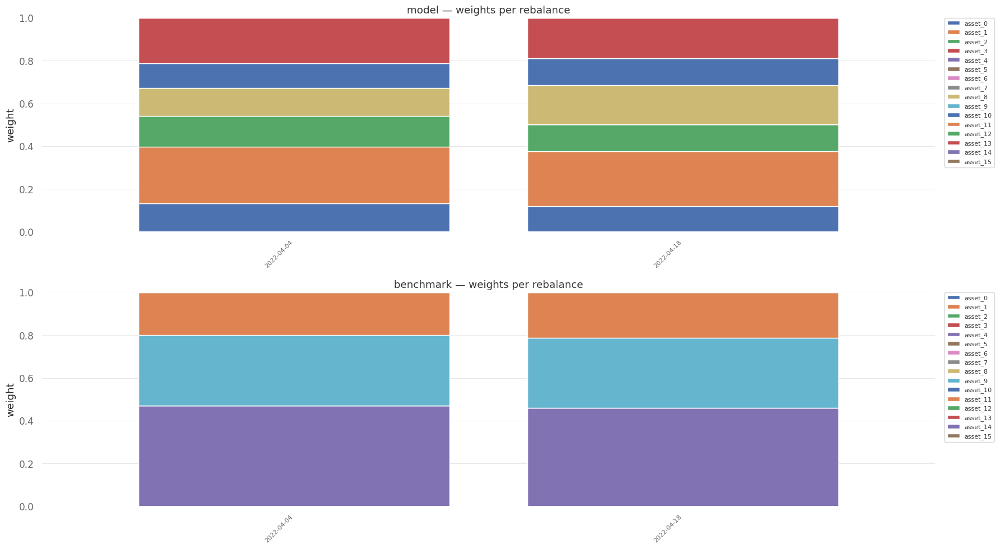

2026-05-28 23:27:29,352 - entities.portfolio - INFO - Strategy: model vs Benchmark: benchmark
2026-05-28 23:27:30,596 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:27:30,603 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:27:30,637 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:27:30,638 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:27:30,681 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:27:30,682 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:27:30,683 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:27:30,723 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:27:30,776 - matplotlib.font_manager - WARNING - findfont: Font famil

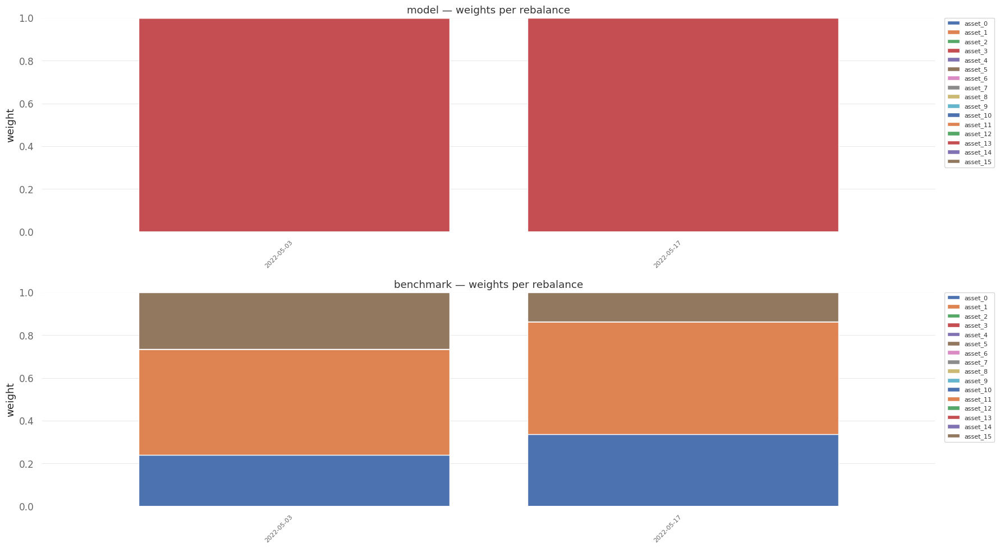

2026-05-28 23:27:39,071 - entities.portfolio - INFO - Strategy: model vs Benchmark: benchmark
2026-05-28 23:27:39,915 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:27:39,917 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:27:39,948 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:27:39,949 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:27:39,990 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:27:39,991 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:27:39,992 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:27:40,031 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:27:40,082 - matplotlib.font_manager - WARNING - findfont: Font famil

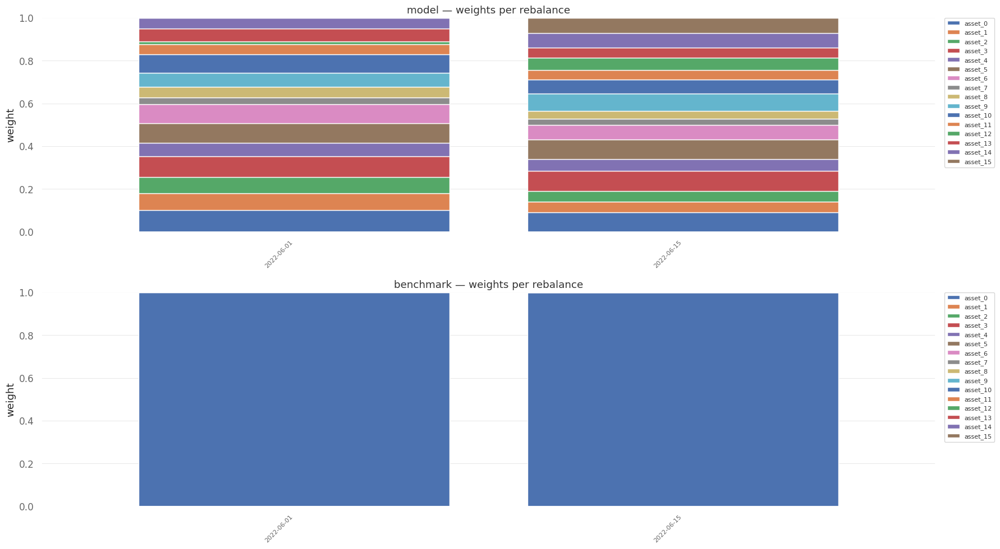

2026-05-28 23:27:48,474 - entities.portfolio - INFO - Strategy: model vs Benchmark: benchmark
2026-05-28 23:27:49,321 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:27:49,322 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:27:49,352 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:27:49,353 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:27:49,393 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:27:49,393 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:27:49,395 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:27:49,433 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:27:49,484 - matplotlib.font_manager - WARNING - findfont: Font famil

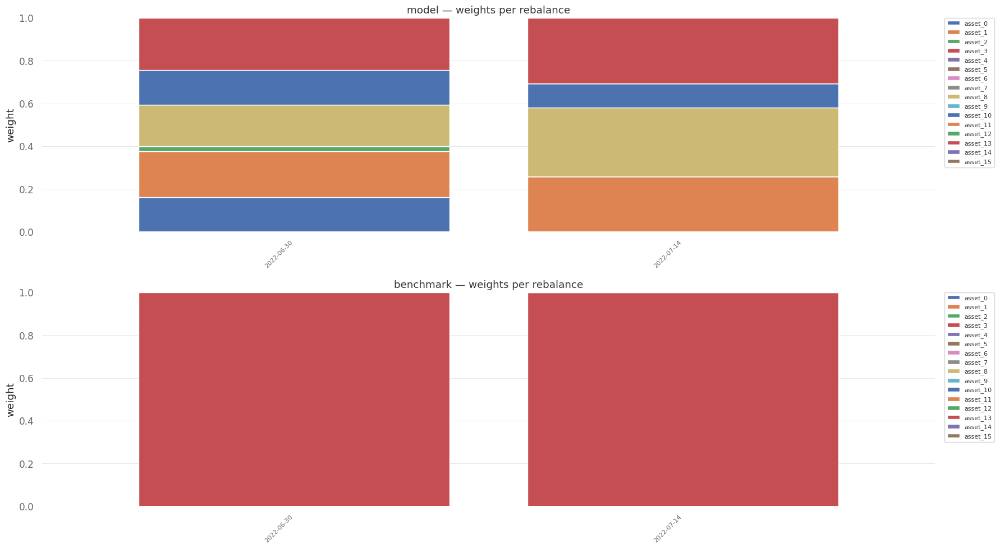

2026-05-28 23:27:58,176 - entities.portfolio - INFO - Strategy: model vs Benchmark: benchmark
2026-05-28 23:27:59,083 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:27:59,085 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:27:59,118 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:27:59,118 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:27:59,166 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:27:59,167 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:27:59,168 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:27:59,211 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:27:59,265 - matplotlib.font_manager - WARNING - findfont: Font famil

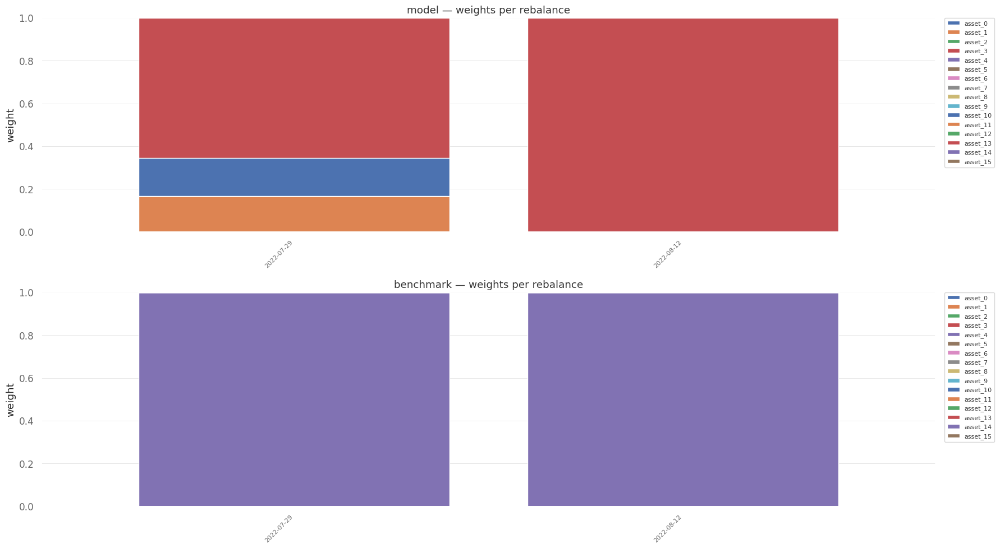

2026-05-28 23:28:07,636 - entities.portfolio - INFO - Strategy: model vs Benchmark: benchmark
2026-05-28 23:28:08,502 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:28:08,503 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:28:08,537 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:28:08,538 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:28:08,583 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:28:08,584 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:28:08,585 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:28:08,627 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:28:08,682 - matplotlib.font_manager - WARNING - findfont: Font famil

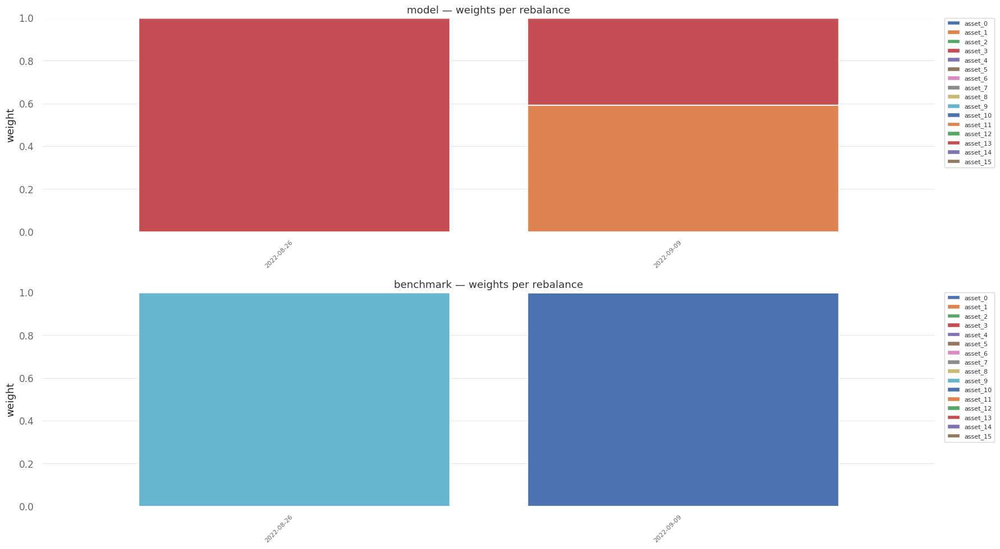

2026-05-28 23:28:17,030 - entities.portfolio - INFO - Strategy: model vs Benchmark: benchmark
2026-05-28 23:28:17,834 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:28:17,835 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:28:17,865 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:28:17,866 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:28:17,907 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:28:17,908 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:28:17,909 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:28:17,947 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:28:18,000 - matplotlib.font_manager - WARNING - findfont: Font famil

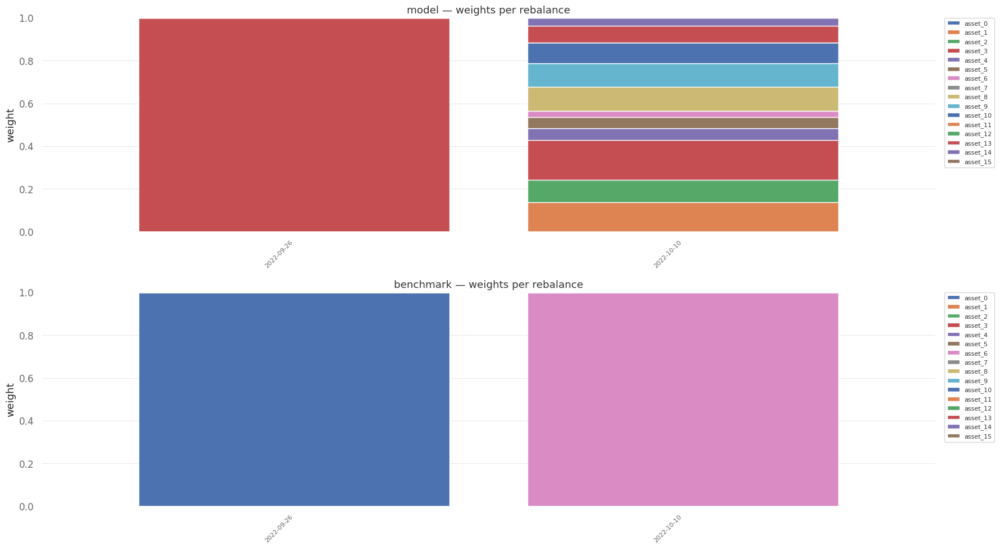

2026-05-28 23:28:26,602 - entities.portfolio - INFO - Strategy: model vs Benchmark: benchmark
2026-05-28 23:28:27,451 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:28:27,452 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:28:27,482 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:28:27,483 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:28:27,524 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:28:27,525 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:28:27,526 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:28:27,565 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:28:27,619 - matplotlib.font_manager - WARNING - findfont: Font famil

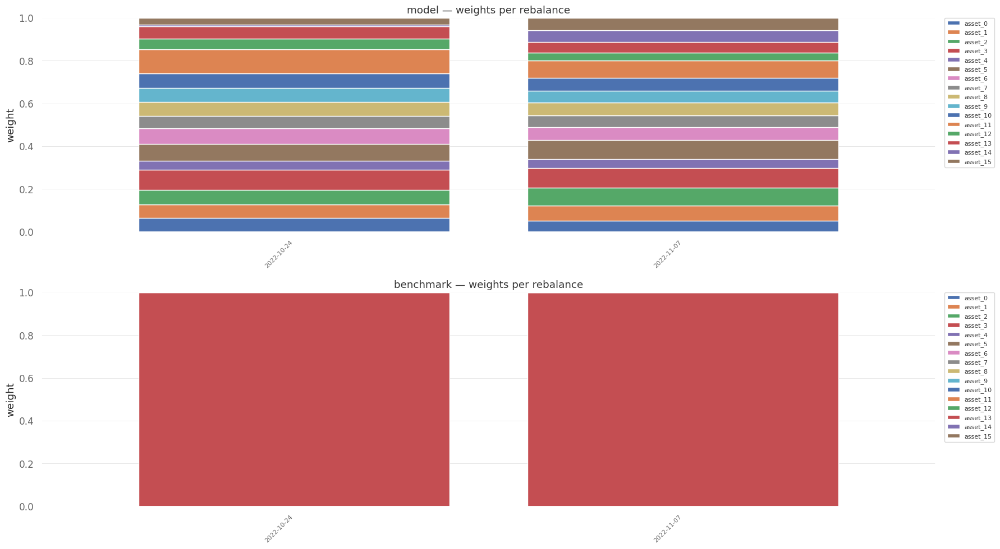

2026-05-28 23:28:35,894 - entities.portfolio - INFO - Strategy: model vs Benchmark: benchmark
2026-05-28 23:28:36,723 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:28:36,724 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:28:36,755 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:28:36,756 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:28:36,799 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:28:36,800 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:28:36,801 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:28:36,841 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:28:36,893 - matplotlib.font_manager - WARNING - findfont: Font famil

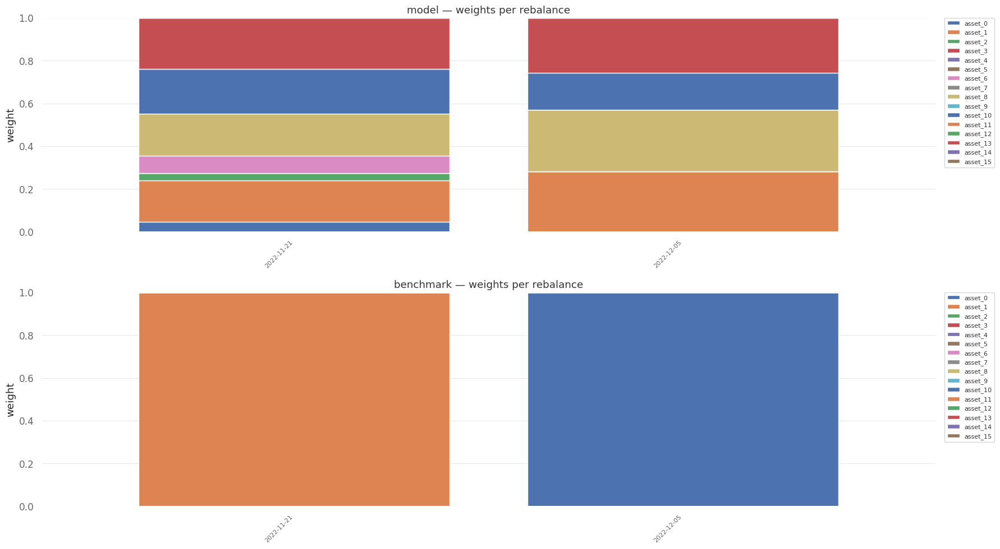

2026-05-28 23:28:44,467 - entities.portfolio - INFO - Strategy: model vs Benchmark: benchmark
2026-05-28 23:28:45,334 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:28:45,335 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:28:45,366 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:28:45,367 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:28:45,410 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:28:45,411 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:28:45,412 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:28:45,450 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:28:45,502 - matplotlib.font_manager - WARNING - findfont: Font famil

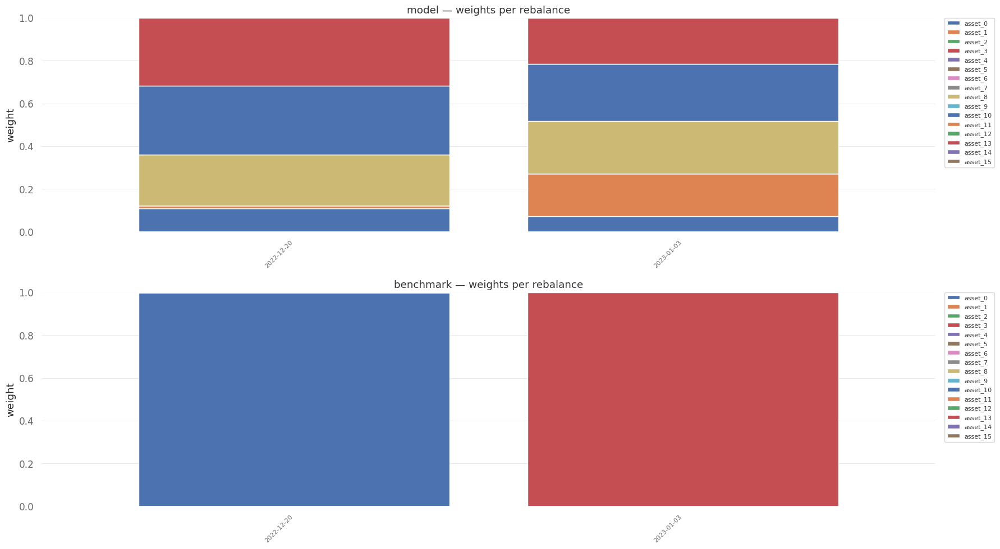

2026-05-28 23:28:53,513 - entities.portfolio - INFO - Strategy: model vs Benchmark: benchmark
2026-05-28 23:28:54,402 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:28:54,404 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:28:54,453 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:28:54,454 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:28:54,524 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:28:54,525 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:28:54,527 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:28:54,571 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:28:54,625 - matplotlib.font_manager - WARNING - findfont: Font famil

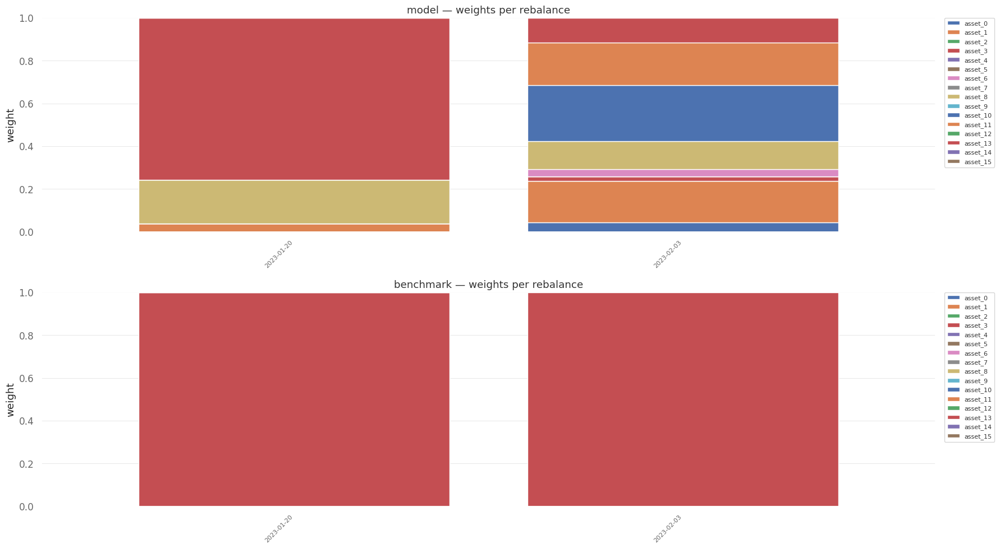

2026-05-28 23:29:02,868 - entities.portfolio - INFO - Strategy: model vs Benchmark: benchmark
2026-05-28 23:29:03,728 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:29:03,729 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:29:03,761 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:29:03,762 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:29:03,804 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:29:03,805 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:29:03,806 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:29:03,846 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:29:03,900 - matplotlib.font_manager - WARNING - findfont: Font famil

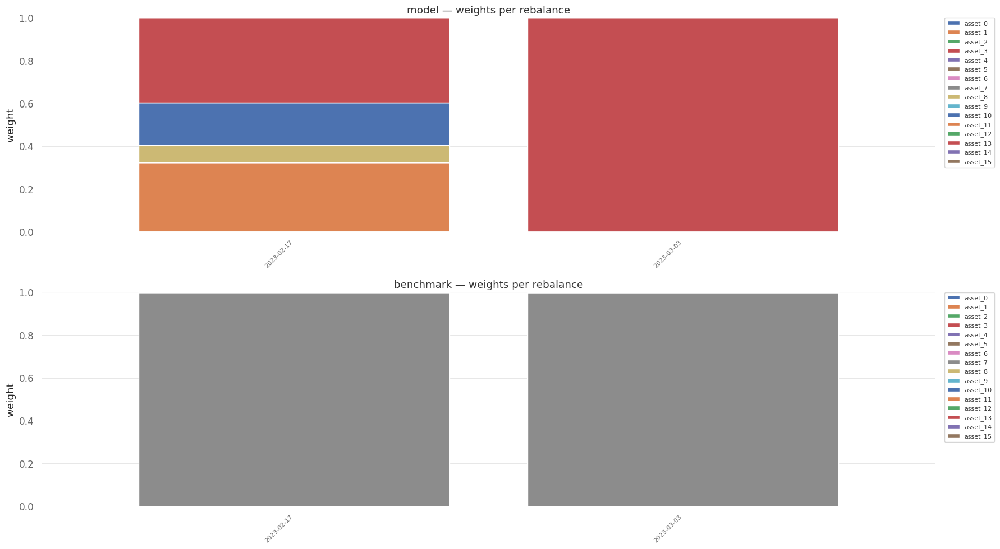

2026-05-28 23:29:12,686 - entities.portfolio - INFO - Strategy: model vs Benchmark: benchmark
2026-05-28 23:29:13,632 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:29:13,633 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:29:13,665 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:29:13,666 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:29:13,707 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:29:13,708 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:29:13,709 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:29:13,747 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:29:13,797 - matplotlib.font_manager - WARNING - findfont: Font famil

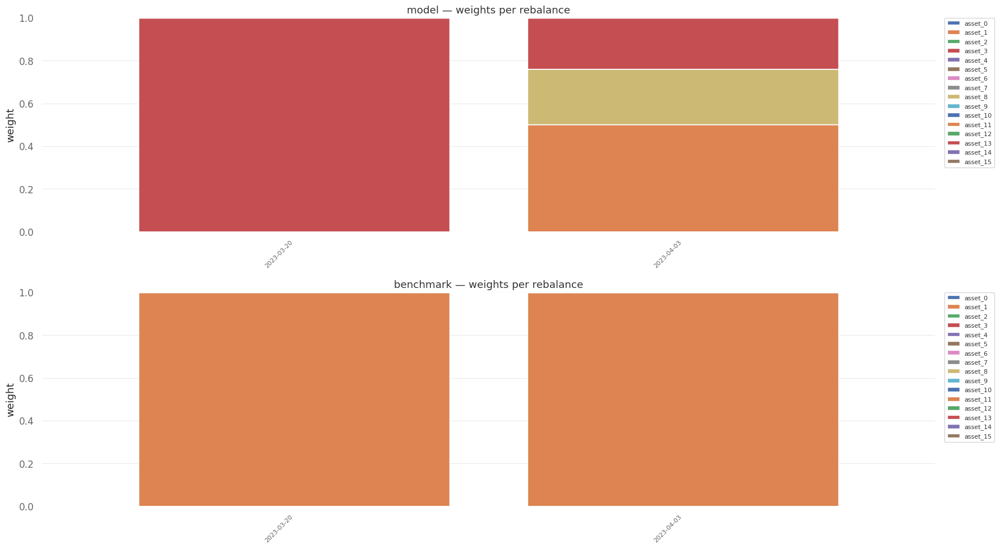

2026-05-28 23:29:22,129 - entities.portfolio - INFO - Strategy: model vs Benchmark: benchmark
2026-05-28 23:29:23,003 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:29:23,005 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:29:23,040 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:29:23,041 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:29:23,091 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:29:23,092 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:29:23,093 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:29:23,137 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:29:23,192 - matplotlib.font_manager - WARNING - findfont: Font famil

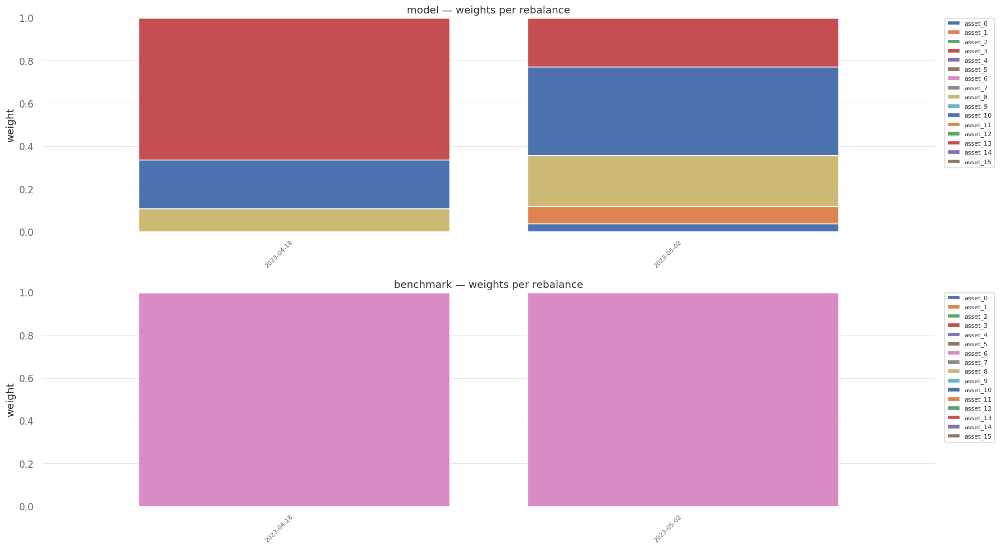

2026-05-28 23:29:31,546 - entities.portfolio - INFO - Strategy: model vs Benchmark: benchmark
2026-05-28 23:29:32,369 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:29:32,370 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:29:32,403 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:29:32,404 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:29:32,450 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:29:32,451 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:29:32,452 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:29:32,494 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:29:32,548 - matplotlib.font_manager - WARNING - findfont: Font famil

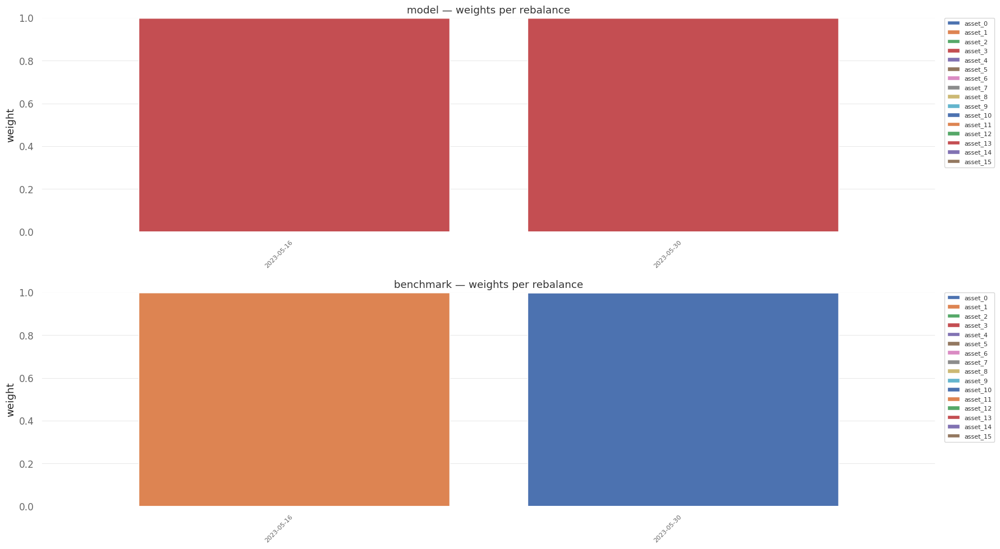

2026-05-28 23:29:40,711 - entities.portfolio - INFO - Strategy: model vs Benchmark: benchmark
2026-05-28 23:29:41,531 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:29:41,532 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:29:41,565 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:29:41,566 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:29:41,612 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:29:41,613 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:29:41,614 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:29:41,656 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:29:41,709 - matplotlib.font_manager - WARNING - findfont: Font famil

/home/narodom.y@FUSION.LAB/.conda/envs/tsgenai/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning:

invalid value encountered in sqrt



2026-05-28 23:29:45,085 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:29:45,086 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:29:45,120 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:29:45,121 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.


/home/narodom.y@FUSION.LAB/.conda/envs/tsgenai/lib/python3.11/site-packages/scipy/stats/_distn_infrastructure.py:2323: RuntimeWarning:

invalid value encountered in multiply

/home/narodom.y@FUSION.LAB/.conda/envs/tsgenai/lib/python3.11/site-packages/scipy/stats/_distn_infrastructure.py:2324: RuntimeWarning:

invalid value encountered in multiply



2026-05-28 23:29:45,168 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:29:45,169 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:29:45,170 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:29:45,213 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:29:45,269 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:29:45,270 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:29:45,305 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:29:45,306 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:29:45,352 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:29:45,353 - matplotlib.font_manager - WARNING - findfont: F

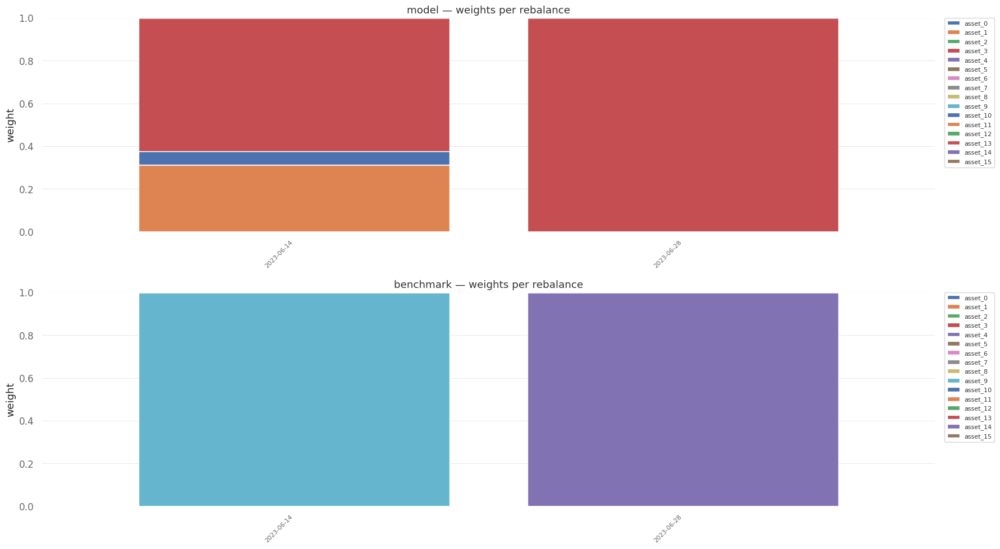

2026-05-28 23:29:50,225 - entities.portfolio - INFO - Strategy: model vs Benchmark: benchmark
2026-05-28 23:29:51,063 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:29:51,064 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:29:51,095 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:29:51,096 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:29:51,140 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:29:51,141 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:29:51,142 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:29:51,183 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:29:51,236 - matplotlib.font_manager - WARNING - findfont: Font famil

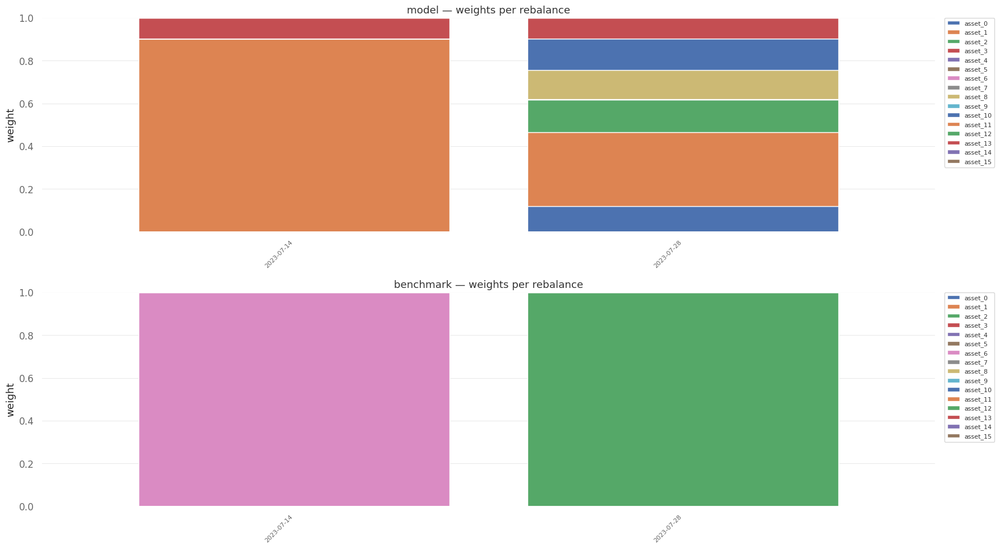

2026-05-28 23:29:59,180 - entities.portfolio - INFO - Strategy: model vs Benchmark: benchmark
2026-05-28 23:30:00,022 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:30:00,023 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:30:00,057 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:30:00,058 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:30:00,102 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:30:00,103 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:30:00,104 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:30:00,144 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:30:00,198 - matplotlib.font_manager - WARNING - findfont: Font famil

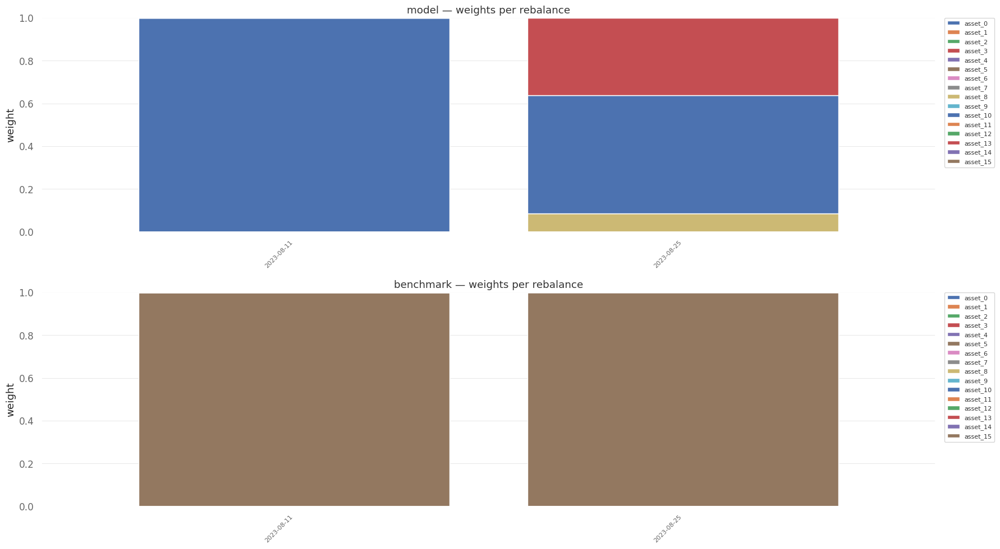

2026-05-28 23:30:08,781 - entities.portfolio - INFO - Strategy: model vs Benchmark: benchmark
2026-05-28 23:30:09,614 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:30:09,615 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:30:09,648 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:30:09,648 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:30:09,692 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:30:09,693 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:30:09,694 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:30:09,734 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:30:09,783 - matplotlib.font_manager - WARNING - findfont: Font famil

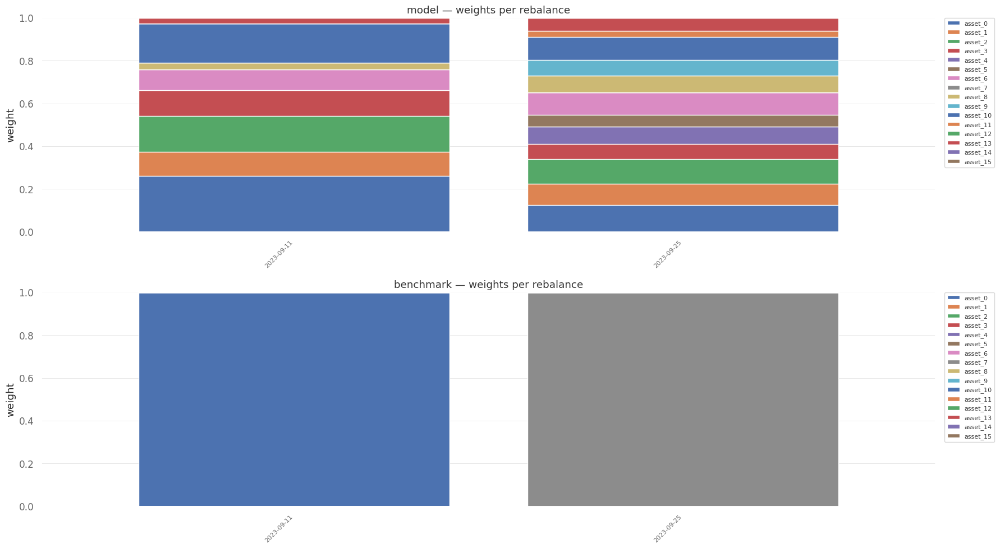

2026-05-28 23:30:18,124 - entities.portfolio - INFO - Strategy: model vs Benchmark: benchmark
2026-05-28 23:30:18,953 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:30:18,955 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:30:18,985 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:30:18,985 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:30:19,027 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:30:19,028 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:30:19,029 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:30:19,066 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:30:19,114 - matplotlib.font_manager - WARNING - findfont: Font famil

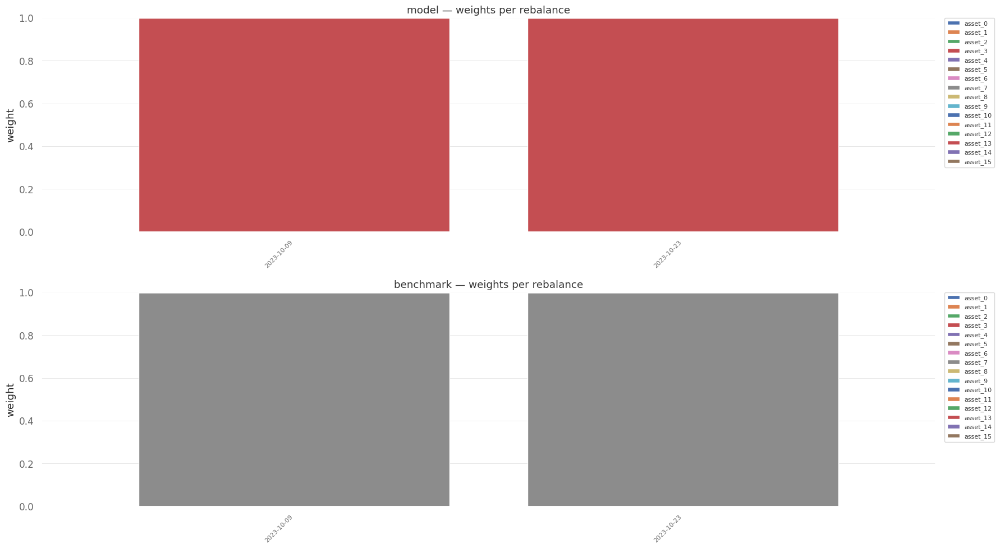

2026-05-28 23:30:26,754 - entities.portfolio - INFO - Strategy: model vs Benchmark: benchmark
2026-05-28 23:30:27,588 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:30:27,589 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:30:27,624 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:30:27,625 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:30:27,669 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:30:27,669 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:30:27,671 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:30:27,711 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:30:28,197 - matplotlib.font_manager - WARNING - findfont: Font famil

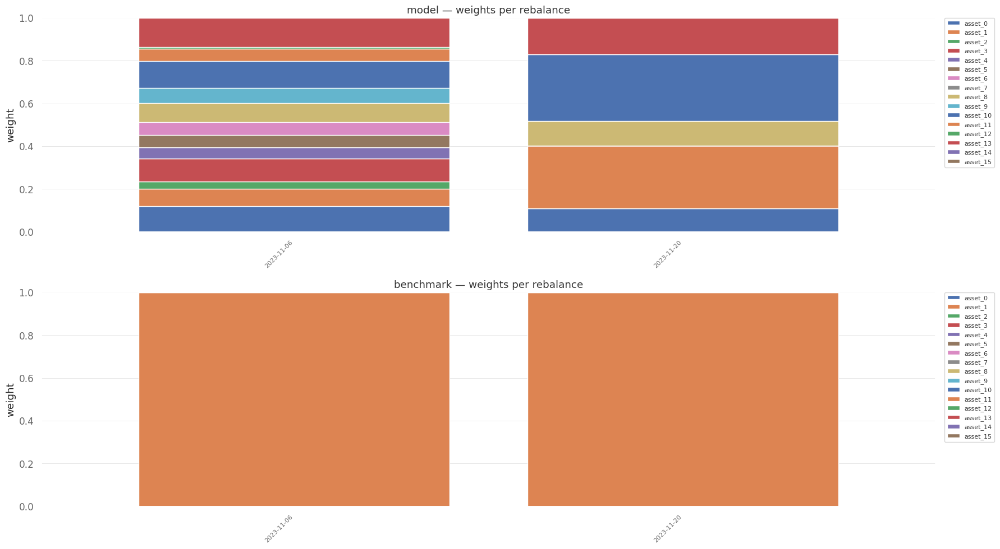

2026-05-28 23:30:36,108 - entities.portfolio - INFO - Strategy: model vs Benchmark: benchmark
2026-05-28 23:30:36,953 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:30:36,955 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:30:36,986 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:30:36,987 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:30:37,030 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:30:37,030 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:30:37,032 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:30:37,072 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:30:37,124 - matplotlib.font_manager - WARNING - findfont: Font famil

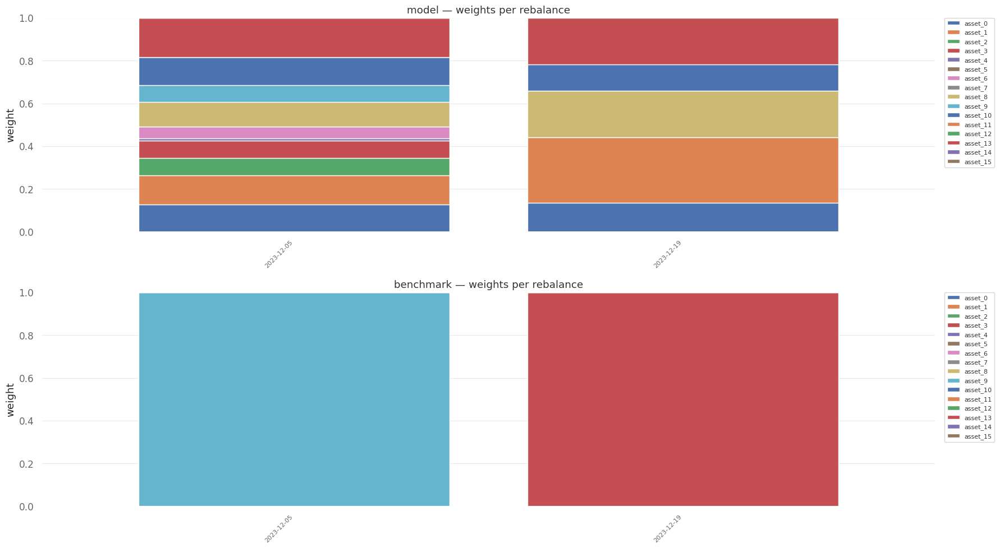

2026-05-28 23:30:45,269 - entities.portfolio - INFO - Strategy: model vs Benchmark: benchmark
2026-05-28 23:30:46,033 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:30:46,034 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:30:46,067 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:30:46,068 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:30:46,115 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:30:46,115 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:30:46,117 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:30:46,158 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:30:46,211 - matplotlib.font_manager - WARNING - findfont: Font famil

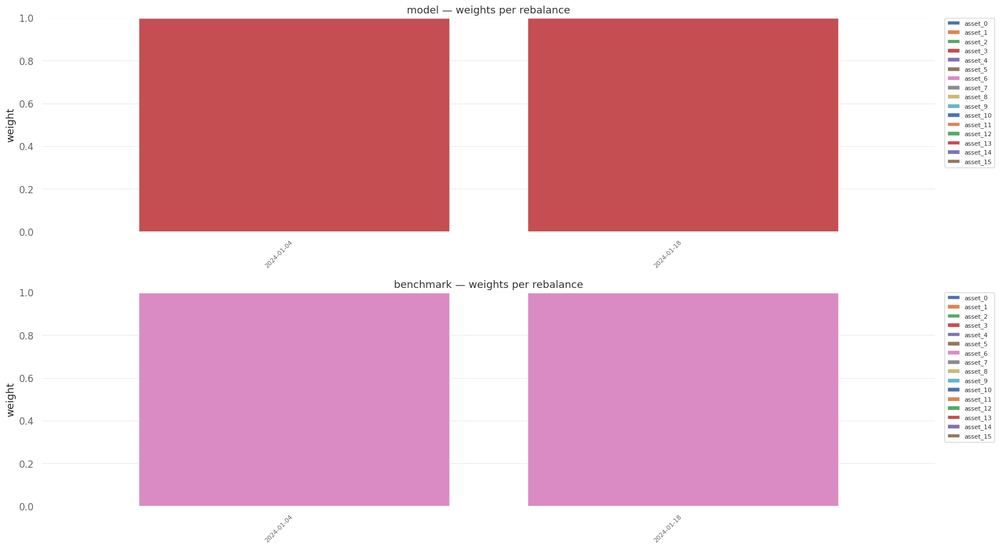

2026-05-28 23:30:54,519 - entities.portfolio - INFO - Strategy: model vs Benchmark: benchmark
2026-05-28 23:30:55,363 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:30:55,364 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:30:55,398 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:30:55,399 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:30:55,445 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:30:55,446 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:30:55,447 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:30:55,490 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:30:55,544 - matplotlib.font_manager - WARNING - findfont: Font famil

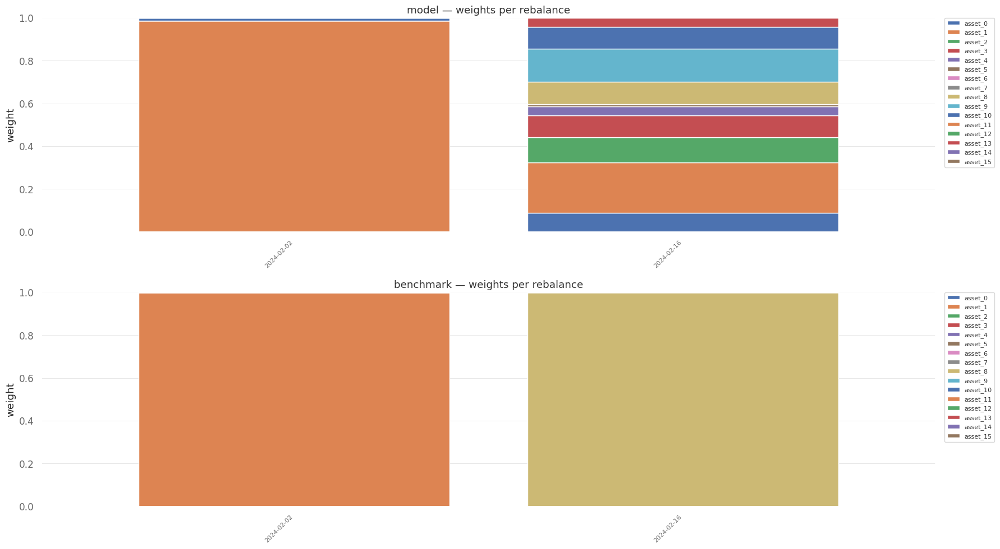

2026-05-28 23:31:03,990 - entities.portfolio - INFO - Strategy: model vs Benchmark: benchmark
2026-05-28 23:31:04,828 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:31:04,829 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:31:04,860 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:31:04,861 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:31:04,904 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:31:04,905 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:31:04,906 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:31:04,945 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:31:04,998 - matplotlib.font_manager - WARNING - findfont: Font famil

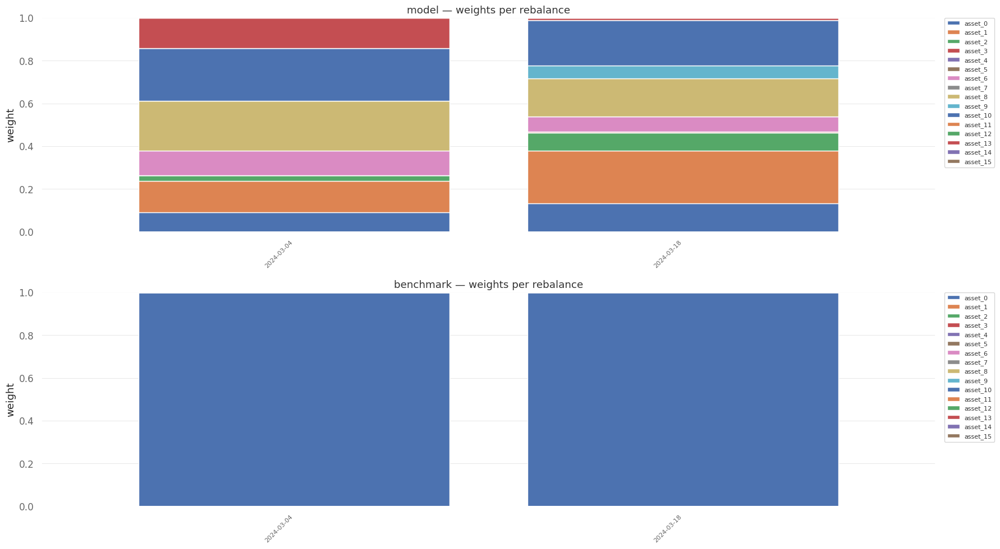

2026-05-28 23:31:13,773 - entities.portfolio - INFO - Strategy: model vs Benchmark: benchmark
2026-05-28 23:31:14,617 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:31:14,618 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:31:14,651 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:31:14,652 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:31:14,697 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:31:14,698 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:31:14,700 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:31:14,741 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:31:14,794 - matplotlib.font_manager - WARNING - findfont: Font famil

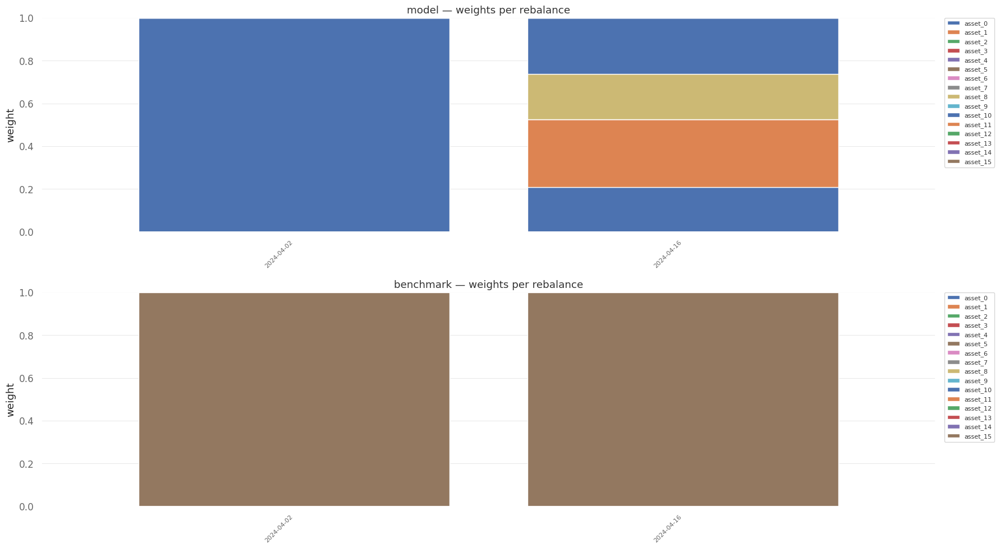

2026-05-28 23:31:23,099 - entities.portfolio - INFO - Strategy: model vs Benchmark: benchmark
2026-05-28 23:31:23,949 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:31:23,950 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:31:23,984 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:31:23,985 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:31:24,031 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:31:24,031 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:31:24,033 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:31:24,074 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:31:24,127 - matplotlib.font_manager - WARNING - findfont: Font famil

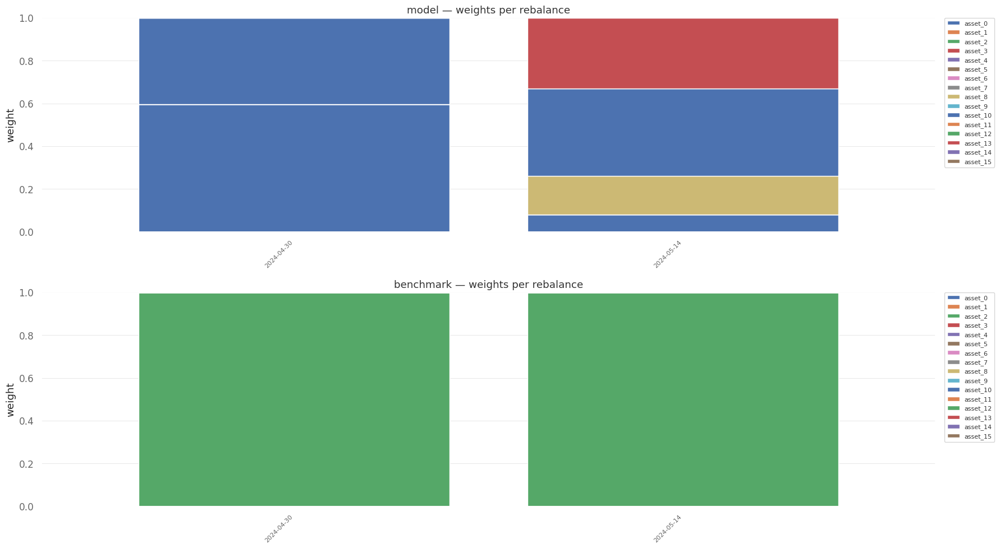

2026-05-28 23:31:32,418 - entities.portfolio - INFO - Strategy: model vs Benchmark: benchmark
2026-05-28 23:31:33,271 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:31:33,272 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:31:33,305 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:31:33,306 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:31:33,351 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:31:33,352 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:31:33,353 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:31:33,395 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:31:33,452 - matplotlib.font_manager - WARNING - findfont: Font famil

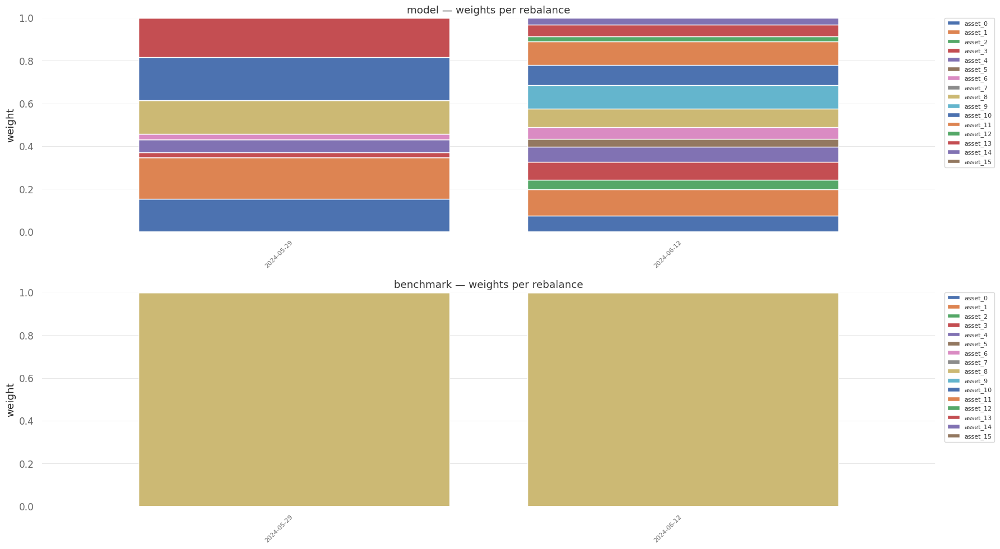

2026-05-28 23:31:41,152 - entities.portfolio - INFO - Strategy: model vs Benchmark: benchmark
2026-05-28 23:31:41,993 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:31:41,994 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:31:42,030 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:31:42,030 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:31:42,078 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:31:42,079 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:31:42,081 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:31:42,125 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:31:42,177 - matplotlib.font_manager - WARNING - findfont: Font famil

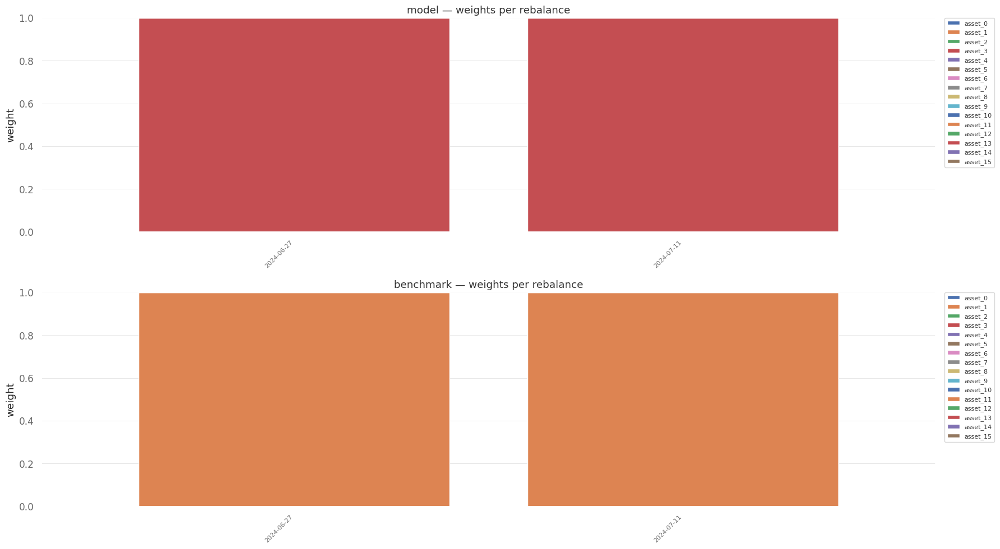

2026-05-28 23:31:50,391 - entities.portfolio - INFO - Strategy: model vs Benchmark: benchmark


/home/narodom.y@FUSION.LAB/.conda/envs/tsgenai/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning:

invalid value encountered in sqrt

/home/narodom.y@FUSION.LAB/.conda/envs/tsgenai/lib/python3.11/site-packages/scipy/stats/_distn_infrastructure.py:2323: RuntimeWarning:

invalid value encountered in multiply

/home/narodom.y@FUSION.LAB/.conda/envs/tsgenai/lib/python3.11/site-packages/scipy/stats/_distn_infrastructure.py:2324: RuntimeWarning:

invalid value encountered in multiply



2026-05-28 23:31:51,217 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:31:51,218 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:31:51,251 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:31:51,252 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:31:51,297 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:31:51,299 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:31:51,300 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:31:51,342 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:31:51,394 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:31:51,395 - matplotlib.font_manager - WARNING - findfont: F

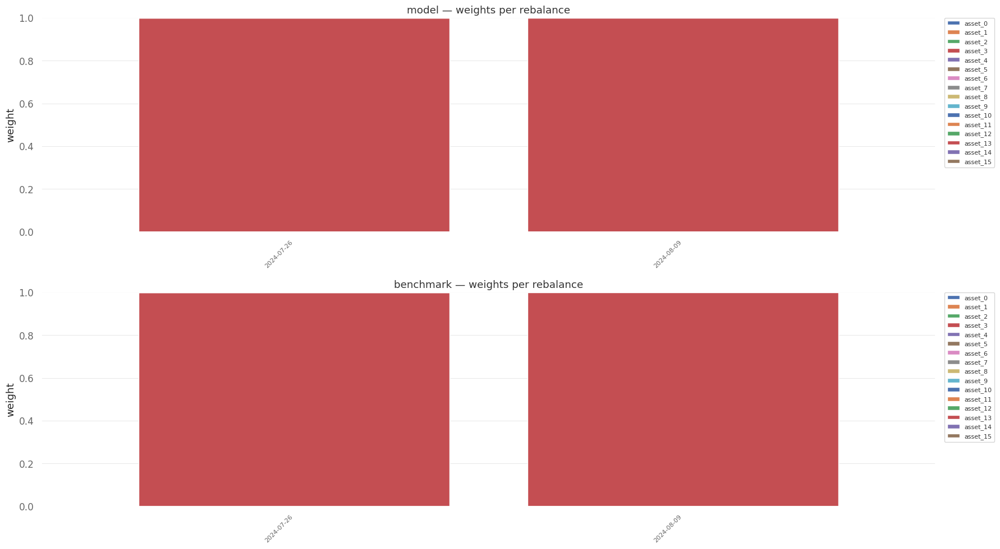

2026-05-28 23:31:59,534 - entities.portfolio - INFO - Strategy: model vs Benchmark: benchmark
2026-05-28 23:32:00,384 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:32:00,385 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:32:00,418 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:32:00,419 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:32:00,464 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:32:00,465 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:32:00,466 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:32:00,509 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:32:00,560 - matplotlib.font_manager - WARNING - findfont: Font famil

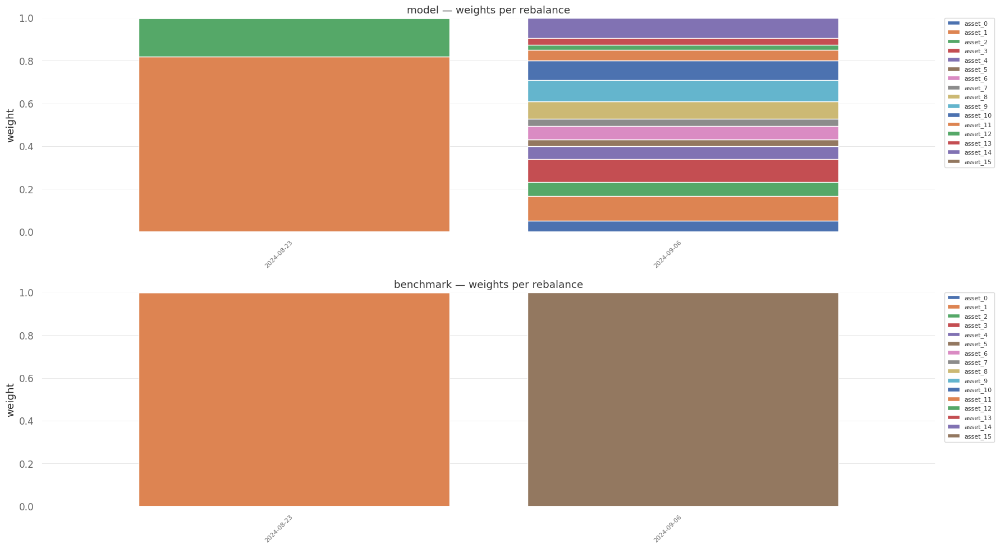

2026-05-28 23:32:08,829 - entities.portfolio - INFO - Strategy: model vs Benchmark: benchmark
2026-05-28 23:32:09,656 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:32:09,657 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:32:09,690 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:32:09,691 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:32:09,736 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:32:09,737 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:32:09,739 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:32:09,781 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:32:09,833 - matplotlib.font_manager - WARNING - findfont: Font famil

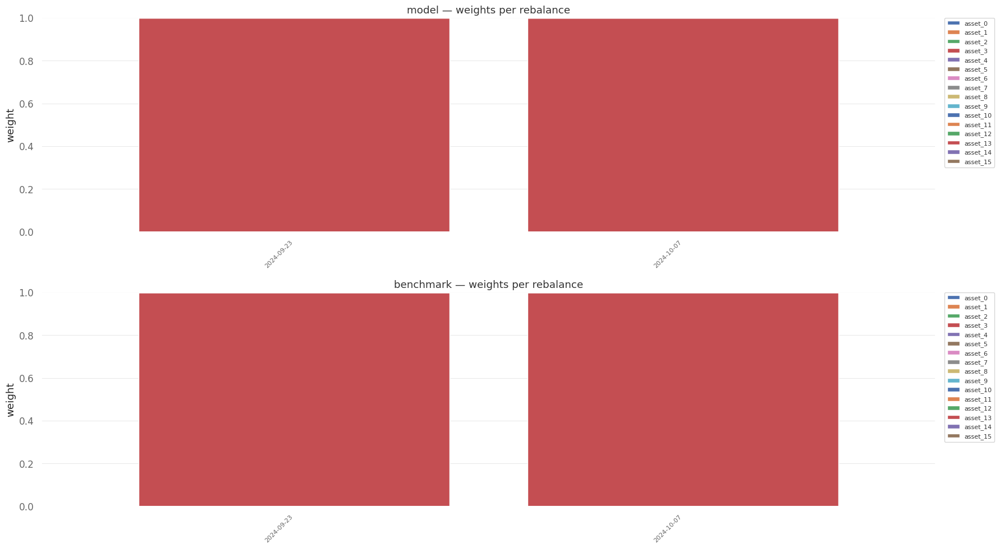

2026-05-28 23:32:17,947 - entities.portfolio - INFO - Strategy: model vs Benchmark: benchmark
2026-05-28 23:32:18,811 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:32:18,812 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:32:18,842 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:32:18,843 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:32:18,884 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:32:18,885 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:32:18,886 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:32:18,924 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:32:18,974 - matplotlib.font_manager - WARNING - findfont: Font famil

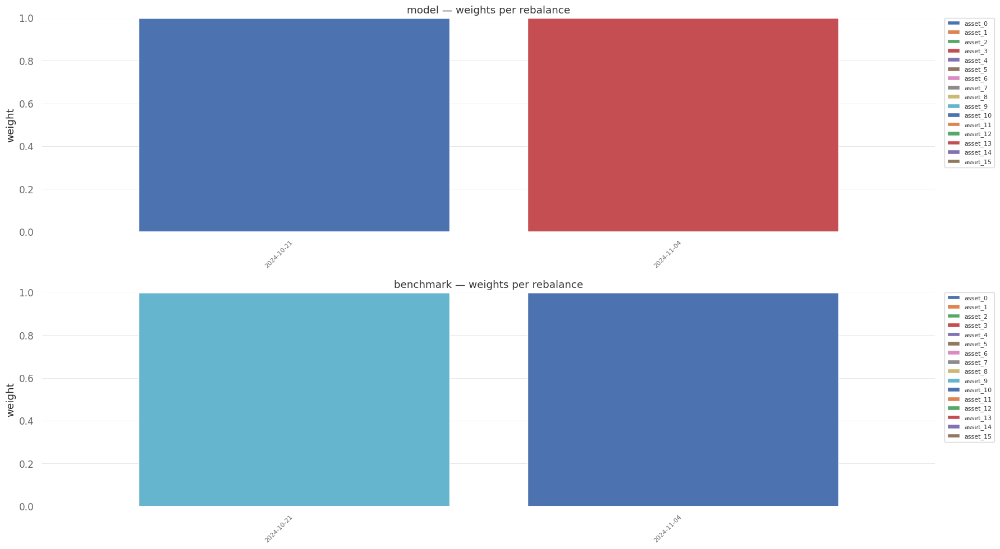

2026-05-28 23:32:26,990 - entities.portfolio - INFO - Strategy: model vs Benchmark: benchmark
2026-05-28 23:32:27,828 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:32:27,829 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:32:27,863 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:32:27,864 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:32:27,912 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:32:27,913 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:32:27,914 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:32:27,957 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:32:28,007 - matplotlib.font_manager - WARNING - findfont: Font famil

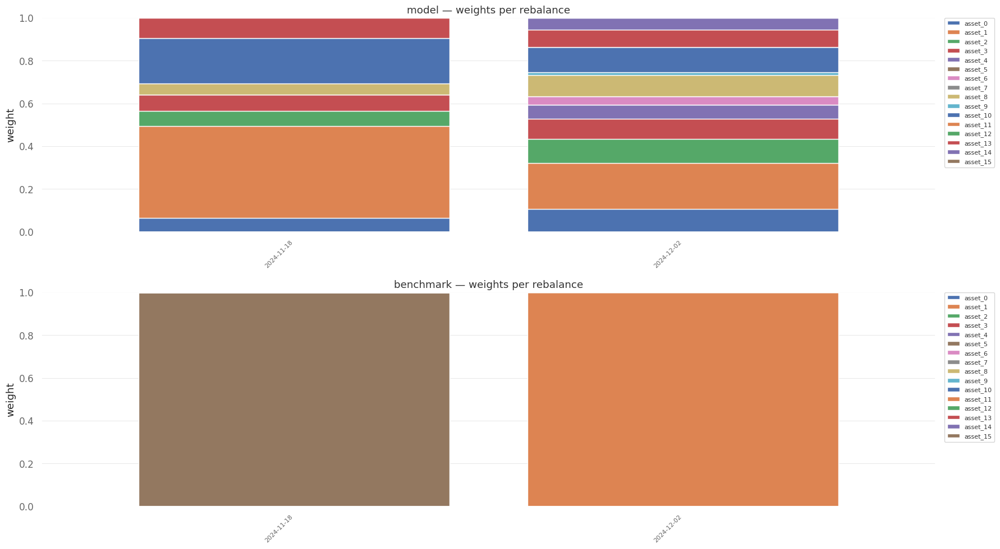

2026-05-28 23:32:36,449 - entities.portfolio - INFO - Strategy: model vs Benchmark: benchmark
2026-05-28 23:32:37,306 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:32:37,307 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:32:37,341 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:32:37,342 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:32:37,386 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:32:37,387 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:32:37,388 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:32:37,430 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:32:37,485 - matplotlib.font_manager - WARNING - findfont: Font famil

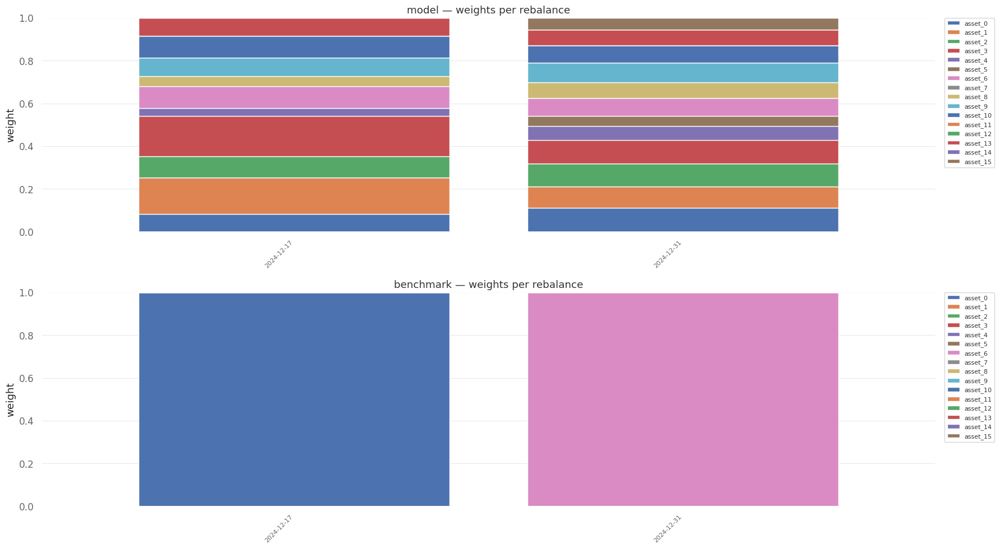

2026-05-28 23:32:46,411 - entities.portfolio - INFO - Strategy: model vs Benchmark: benchmark
2026-05-28 23:32:47,267 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:32:47,269 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:32:47,302 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:32:47,303 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:32:47,348 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:32:47,349 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:32:47,350 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:32:47,393 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:32:47,448 - matplotlib.font_manager - WARNING - findfont: Font famil

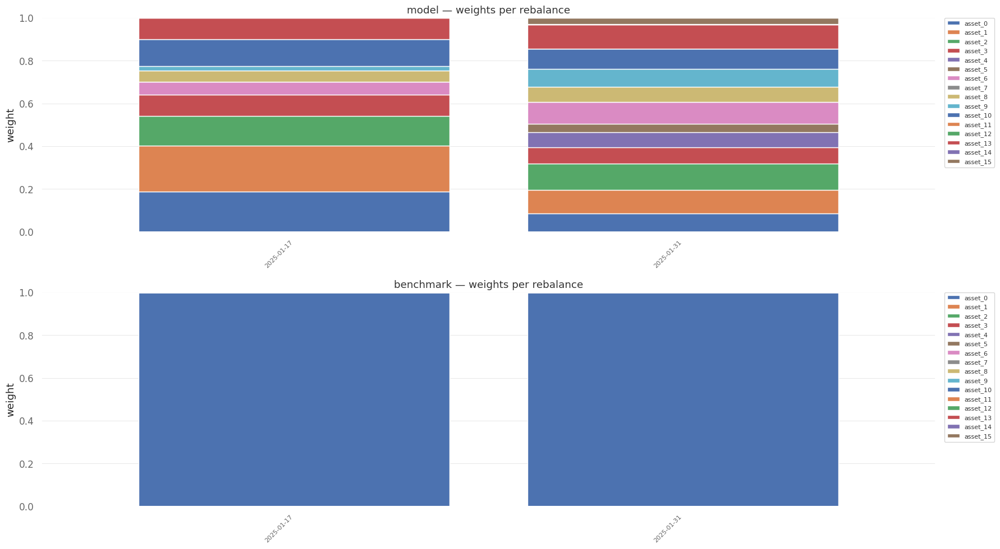

2026-05-28 23:32:56,524 - entities.portfolio - INFO - Strategy: model vs Benchmark: benchmark
2026-05-28 23:32:57,396 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:32:57,397 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:32:57,431 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:32:57,432 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:32:57,479 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:32:57,480 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:32:57,481 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:32:57,524 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:32:57,577 - matplotlib.font_manager - WARNING - findfont: Font famil

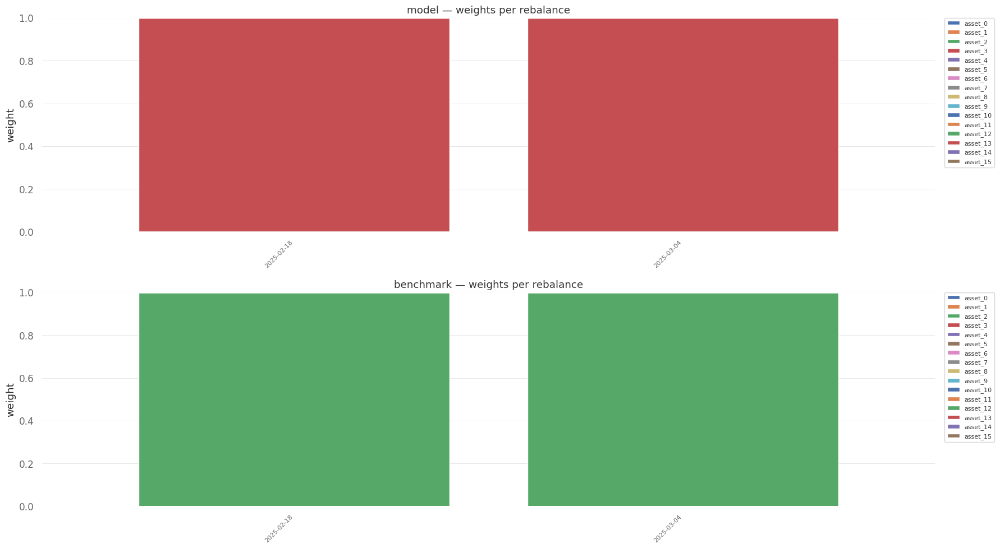

2026-05-28 23:33:05,415 - entities.portfolio - INFO - Strategy: model vs Benchmark: benchmark
2026-05-28 23:33:06,258 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:33:06,259 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:33:06,294 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:33:06,294 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:33:06,339 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:33:06,340 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:33:06,341 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:33:06,382 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:33:06,436 - matplotlib.font_manager - WARNING - findfont: Font famil

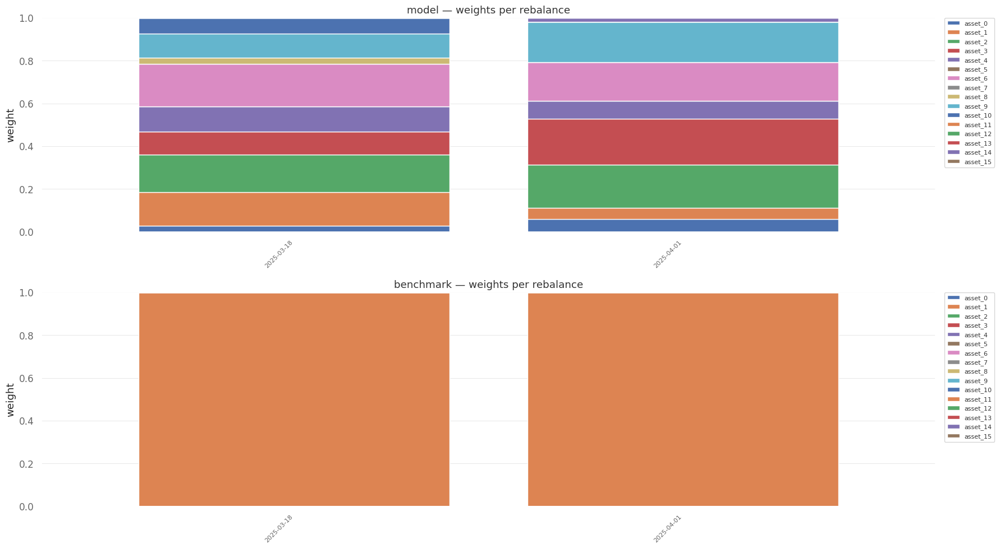

2026-05-28 23:33:14,661 - entities.portfolio - INFO - Strategy: model vs Benchmark: benchmark
2026-05-28 23:33:15,409 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:33:15,410 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:33:15,445 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:33:15,446 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:33:15,494 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:33:15,494 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:33:15,496 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:33:15,539 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:33:15,595 - matplotlib.font_manager - WARNING - findfont: Font famil

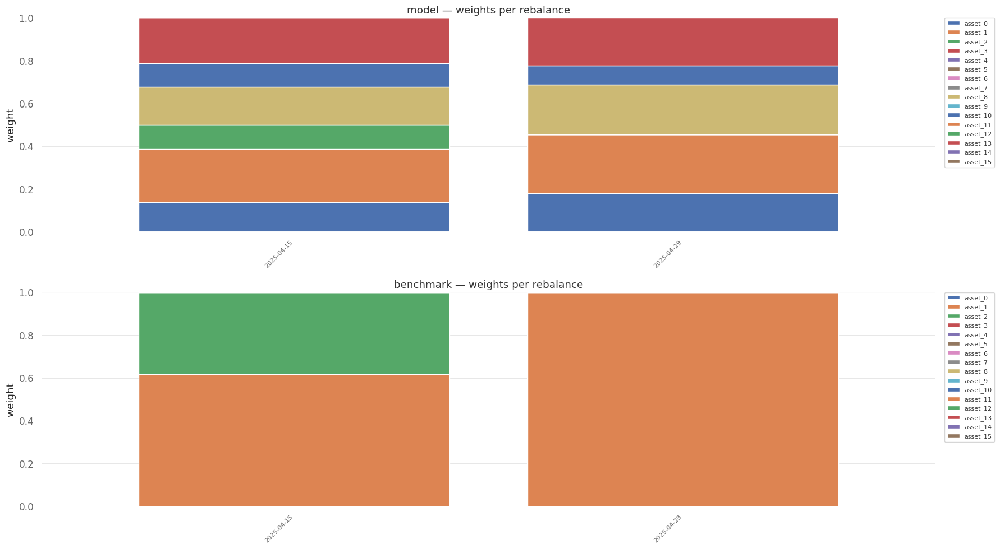

2026-05-28 23:33:23,932 - entities.portfolio - INFO - Strategy: model vs Benchmark: benchmark
2026-05-28 23:33:24,769 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:33:24,771 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:33:24,804 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:33:24,805 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:33:24,850 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:33:24,851 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:33:24,852 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:33:24,893 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:33:24,945 - matplotlib.font_manager - WARNING - findfont: Font famil

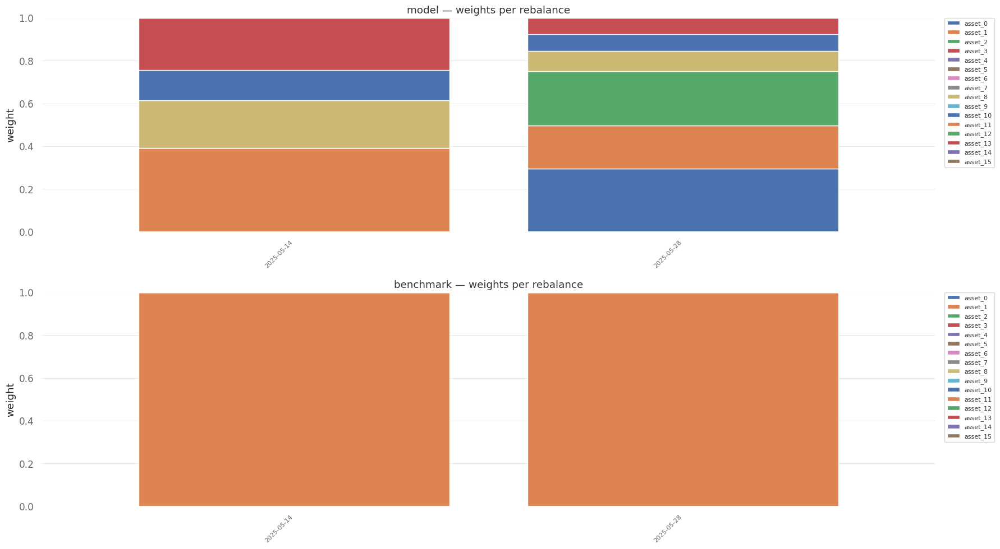

2026-05-28 23:33:32,779 - entities.portfolio - INFO - Strategy: model vs Benchmark: benchmark
2026-05-28 23:33:33,627 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:33:33,628 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:33:33,663 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:33:33,664 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:33:33,713 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:33:33,714 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:33:33,715 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:33:33,760 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:33:34,504 - matplotlib.font_manager - WARNING - findfont: Font famil

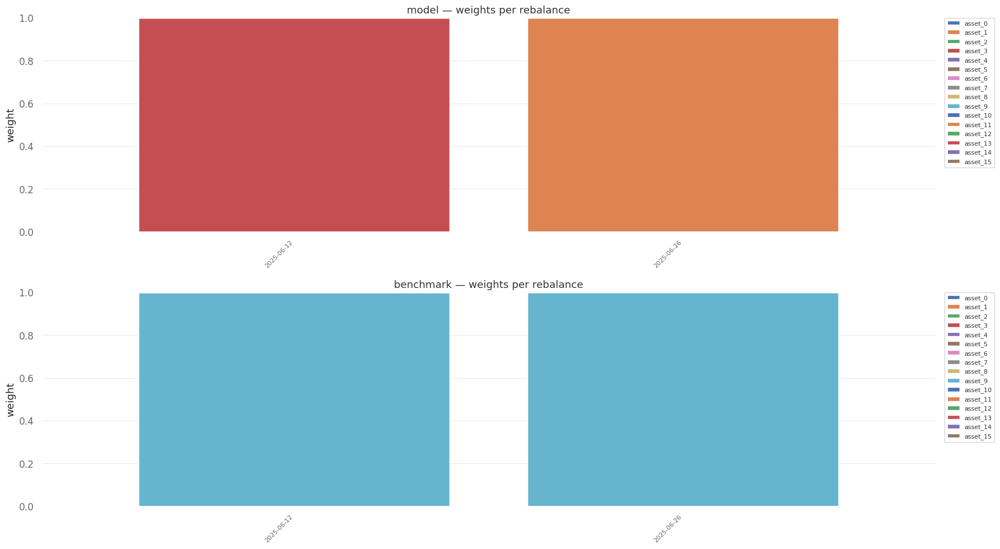

2026-05-28 23:33:42,245 - entities.portfolio - INFO - Strategy: model vs Benchmark: benchmark
2026-05-28 23:33:43,090 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:33:43,091 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:33:43,123 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:33:43,125 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:33:43,168 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:33:43,169 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:33:43,170 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:33:43,211 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:33:43,266 - matplotlib.font_manager - WARNING - findfont: Font famil

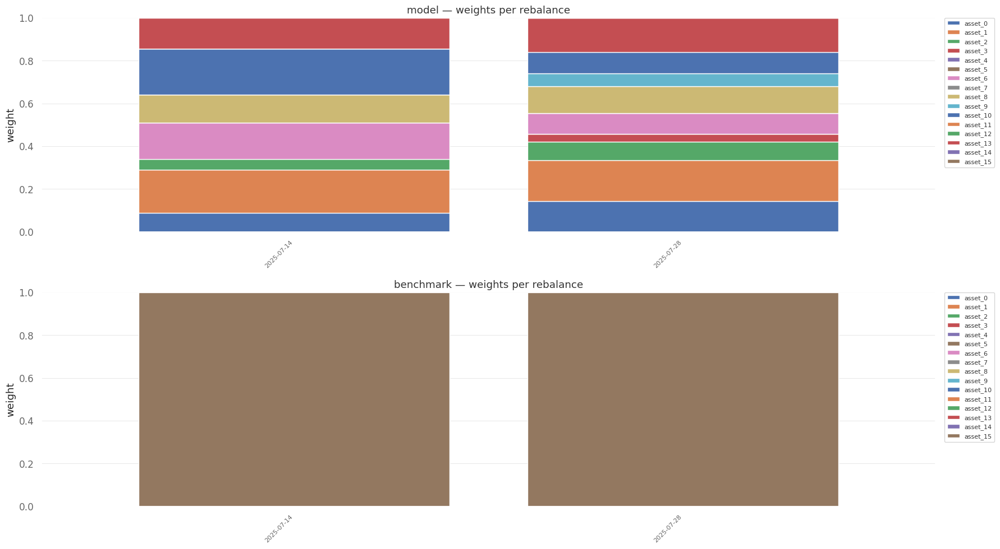

2026-05-28 23:33:51,523 - entities.portfolio - INFO - Strategy: model vs Benchmark: benchmark
2026-05-28 23:33:52,367 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:33:52,368 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:33:52,399 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:33:52,400 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:33:52,444 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:33:52,444 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:33:52,446 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:33:52,486 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:33:52,539 - matplotlib.font_manager - WARNING - findfont: Font famil

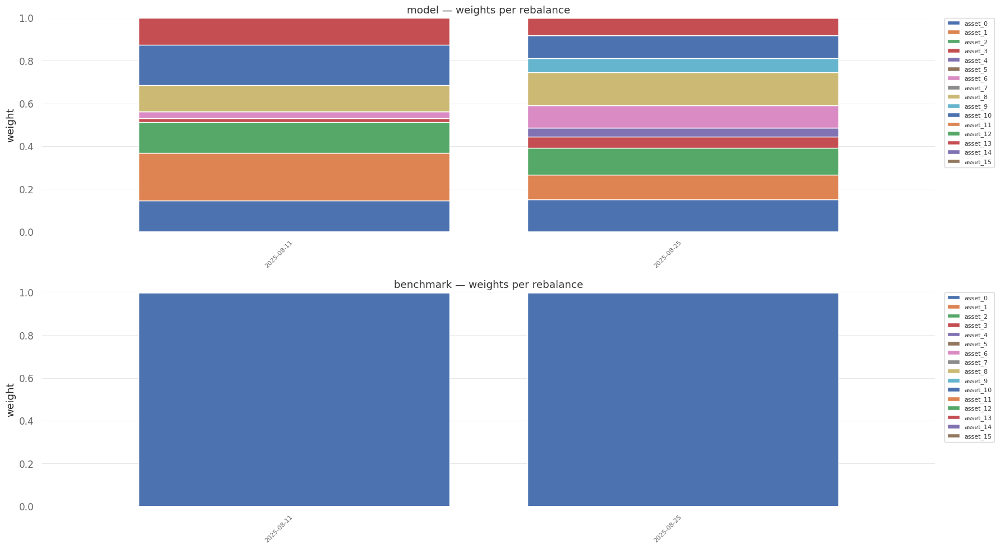

2026-05-28 23:34:00,695 - entities.portfolio - INFO - Strategy: model vs Benchmark: benchmark
2026-05-28 23:34:01,537 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:34:01,538 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:34:01,569 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:34:01,570 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:34:01,615 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:34:01,616 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:34:01,617 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:34:01,658 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:34:01,707 - matplotlib.font_manager - WARNING - findfont: Font famil

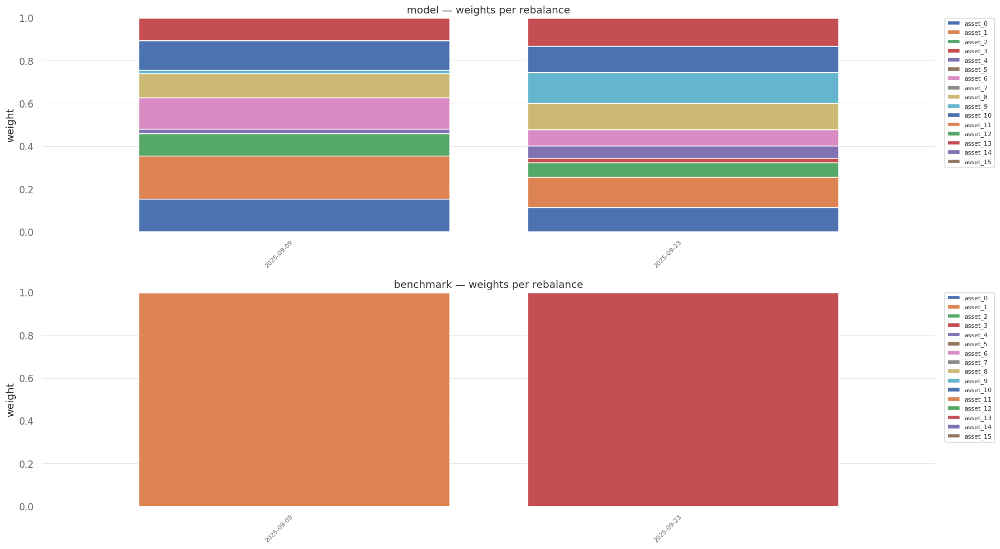

2026-05-28 23:34:09,129 - entities.portfolio - INFO - Strategy: model vs Benchmark: benchmark
2026-05-28 23:34:09,980 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:34:09,981 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:34:10,014 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:34:10,016 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:34:10,061 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:34:10,062 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:34:10,063 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:34:10,104 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:34:10,158 - matplotlib.font_manager - WARNING - findfont: Font famil

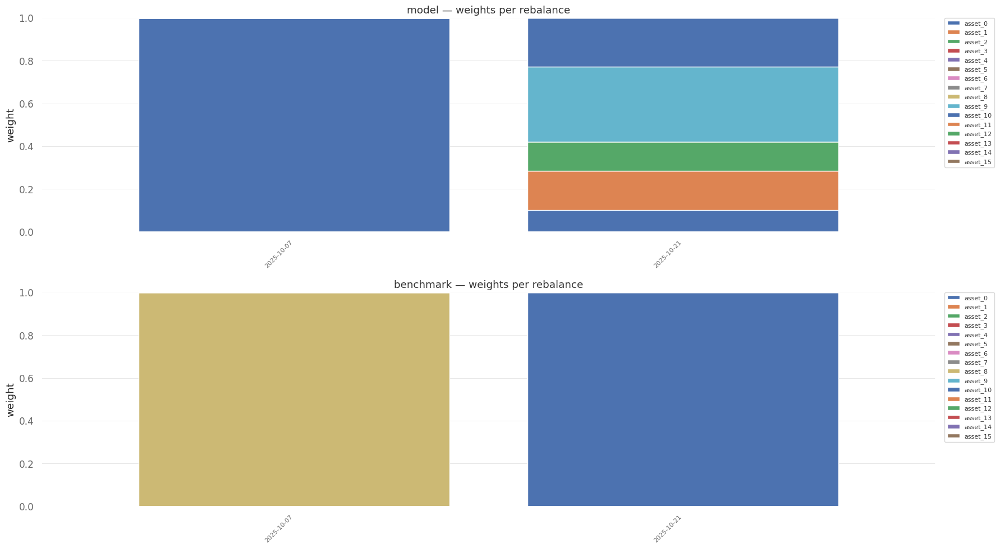

2026-05-28 23:34:18,486 - entities.portfolio - INFO - Strategy: model vs Benchmark: benchmark
2026-05-28 23:34:19,326 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:34:19,328 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:34:19,360 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:34:19,361 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:34:19,406 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:34:19,406 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:34:19,408 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:34:19,449 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:34:19,501 - matplotlib.font_manager - WARNING - findfont: Font famil

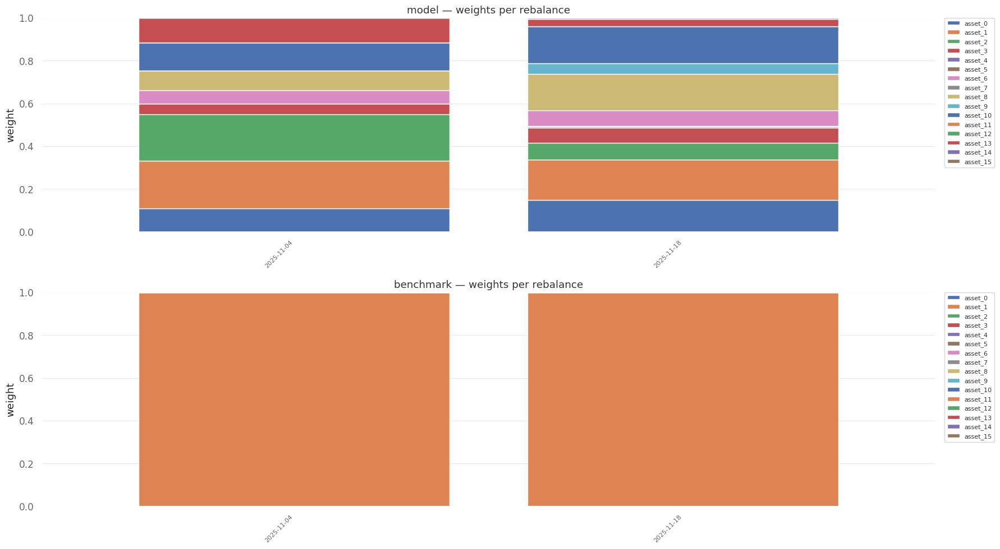

2026-05-28 23:34:27,091 - entities.portfolio - INFO - Strategy: model vs Benchmark: benchmark
2026-05-28 23:34:28,621 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:34:28,622 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:34:28,657 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:34:28,658 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:34:28,707 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:34:28,708 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:34:28,709 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:34:28,753 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-05-28 23:34:28,810 - matplotlib.font_manager - WARNING - findfont: Font famil

In [17]:
# ── Hyperparams ───────────────────────────────────────────────────────
import torch


REBALANCE_FREQ   = 10
OPTIMIZE_WINDOW  = 20
ANNUAL_RF        = 0.02
INIT_CASH        = 1.0
TRANSACTION_COST = 0.0025
# TRANSACTION_COST = 0

portfolio = Portfolio(annual_risk_free_rate=ANNUAL_RF)

# ── Loop ราย sim-window ───────────────────────────────────────────────
all_results = {}  # { window_idx: dict[strategy_name, PortfolioResult] }

for i, w in enumerate(all_windows):
    gt_ret_w   = gt_windows[i]["log_returns"]  # (W, A) ← แทน prepare_gt
    gt_price_w = gt_windows[i]["prices"]       # (W, A) ← แทน prepare_gt


    mc_ret_w         = prepare_mc([w])   # (N, W-1, A) — จาก diffusion model

    # date range ของ window นี้
    dates_w   = pd.to_datetime(w["dates"], unit="ns" if w["dates"][0] > 1e15 else "ms")
    start_w   = dates_w[1].date()   # [1:] เพราะ diff ตัดแถวแรก
    end_w     = dates_w[-1].date()

    # gt_tensor   = torch.tensor(gt_ret_w, dtype=torch.float32)
    # mc_gbm_w    = simulate_mc_gbm(
    #     log_returns = gt_tensor,
    #     n_paths     = N_SIMS,
    #     horizon     = gt_ret_w.shape[0],   # W-1
    # ).numpy()   # (N, W-1, A)

    # hist_ret = get_historical_returns_before(all_windows, current_idx=i, lookback_windows=2)
    hist_ret = get_historical_returns_before(all_windows, current_idx=i, lookback_windows=2)



    if hist_ret is None or len(hist_ret) < 5:
        mc_gbm_w = simulate_mc_gbm(
            log_returns = torch.randn(20, N_ASSETS),
            n_paths     = N_SIMS,
            horizon     = gt_ret_w.shape[0],
        ).numpy()
    else:                                               # ← else หายไป
        hist_tensor = torch.tensor(hist_ret, dtype=torch.float32)
        mc_gbm_w = simulate_mc_gbm(
            log_returns = hist_tensor,
            n_paths     = N_SIMS,
            horizon     = gt_ret_w.shape[0],
        ).numpy()

    strategies = {
        "model"    : mc_ret_w,
        "benchmark": mc_gbm_w,
    }

    results_w = portfolio.experiment(
        gt_returns         = gt_ret_w,
        gt_prices          = gt_price_w,
        strategies         = strategies,
        benchmark_strategy = "benchmark",
        rebalance_freq     = REBALANCE_FREQ,
        optimize_window    = OPTIMIZE_WINDOW,
        start_date         = start_w,
        end_date           = end_w,
        init_cash          = INIT_CASH,
        is_log_return      = True,
        transaction_cost   = TRANSACTION_COST,
        method             = "Per-Path",
        output_dir         = str(inf_cfg.simulation_dir / "reports"),
        output_suffix      = f"_w{i:02d}_rebal{REBALANCE_FREQ}_opt{OPTIMIZE_WINDOW}",
    )

    all_results[i] = results_w
    print(f"✓ window {i:02d} done")

print(f"\n✓ ทั้งหมด {len(all_results)} windows")

In [18]:
all_results

{0: {'model': PortfolioResult(returns=2022-04-04   -0.003405
  2022-04-05    0.030951
  2022-04-06   -0.030158
  2022-04-07   -0.032002
  2022-04-08   -0.000434
  2022-04-11   -0.018641
  2022-04-12   -0.030037
  2022-04-13    0.000129
  2022-04-14    0.023125
  2022-04-15   -0.020397
  2022-04-18    0.007567
  2022-04-19    0.024125
  2022-04-20   -0.033911
  2022-04-21   -0.025243
  2022-04-22   -0.027644
  2022-04-25    0.008110
  2022-04-26   -0.058080
  2022-04-27   -0.007937
  2022-04-28    0.054076
  2022-04-29   -0.058917
  Freq: B, dtype: float64, portfolio=<vectorbt.portfolio.base.Portfolio object at 0x762a22711a50>, weights=             asset_0   asset_1   asset_2  asset_3       asset_4  asset_5  \
  2022-04-04  0.131789  0.266570  0.143481      0.0  0.000000e+00      0.0   
  2022-04-18  0.119508  0.257324  0.124903      0.0  6.179226e-17      0.0   
  
                   asset_6       asset_7   asset_8       asset_9  asset_10  \
  2022-04-04  1.497962e-16  0.000000e+00  0.

In [19]:
print(f"{'strategy':<14} {'sim_win':>8} {'rebal_win':>10} {'init':>8} {'final':>8} {'P&L':>8} {'ret%':>8}")
print("─" * 70)

for win_idx, results_w in all_results.items():
    for name, result in results_w.items():
        for i, wpf in enumerate(result.window_portfolios):
            final   = float(wpf.final_value())
            pnl     = float(wpf.total_profit())
            ret_pct = (final / INIT_CASH - 1) * 100
            print(f"{name:<14} {win_idx:>8} {i+1:>10} {INIT_CASH:>8.2f} {final:>8.4f} {pnl:>8.4f} {ret_pct:>7.2f}%")

strategy        sim_win  rebal_win     init    final      P&L     ret%
──────────────────────────────────────────────────────────────────────
model                 0          1     1.00   0.9255  -0.0745   -7.45%
model                 0          2     1.00   0.8821  -0.1179  -11.79%
benchmark             0          1     1.00   0.9164  -0.0836   -8.36%
benchmark             0          2     1.00   0.9341  -0.0659   -6.59%
model                 1          1     1.00   0.8523  -0.1477  -14.77%
model                 1          2     1.00   1.0487   0.0487    4.87%
benchmark             1          1     1.00   0.9471  -0.0529   -5.29%
benchmark             1          2     1.00   1.0400   0.0400    4.00%
model                 2          1     1.00   0.9040  -0.0960   -9.60%
model                 2          2     1.00   1.0168   0.0168    1.68%
benchmark             2          1     1.00   0.8382  -0.1618  -16.18%
benchmark             2          2     1.00   1.0092   0.0092    0.92%
model 

In [20]:
# print(f"{'strategy':<14} {'sim_win':>8} {'final':>8} {'P&L':>8} {'ret%':>8}")
# print("─" * 56)

# for win_idx, portfolios_w in all_results.items():
#     for name, pf in portfolios_w.items():
#         final   = float(pf.final_value())
#         pnl     = float(pf.total_profit())
#         ret_pct = (final / INIT_CASH - 1) * 100
#         print(f"{name:<14} {win_idx:>8} {INIT_CASH:>8.2f} {final:>8.4f} {pnl:>8.4f} {ret_pct:>7.2f}%")

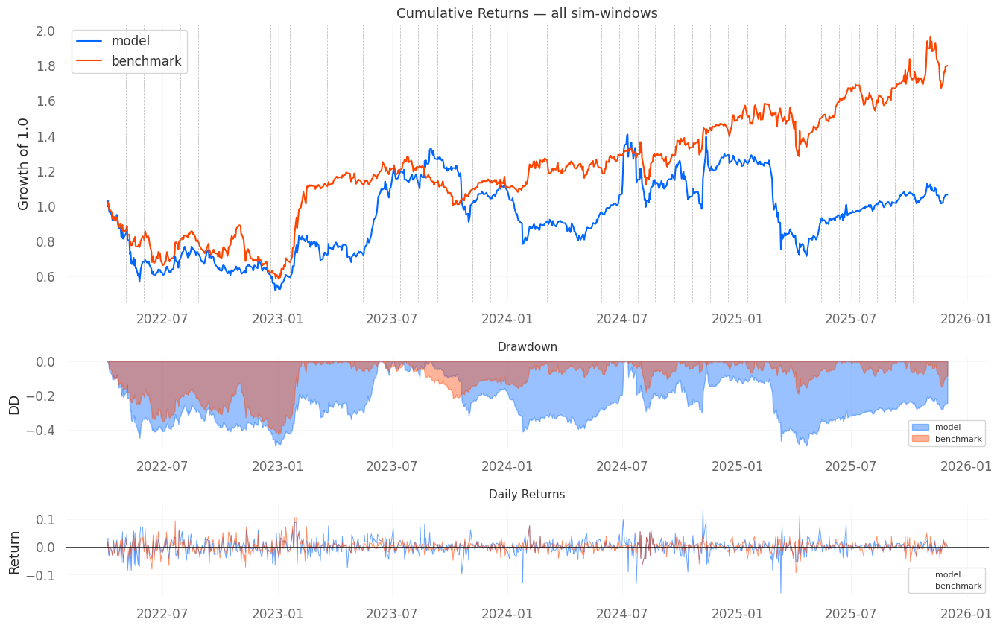


════════════════════════════════════════════════════════════
  Portfolio Stats (full period — all sim-windows concat)
════════════════════════════════════════════════════════════
          Cum. Ret. (%) Ann. Ret. (%) Sharpe Sortino Calmar Max DD (%) LDD (days)
Strategy                                                                         
model             6.33%         1.70%  0.255   0.355  0.034    -49.37%        350
benchmark        79.87%        17.45%  0.645   0.955  0.407    -42.86%        222
════════════════════════════════════════════════════════════


In [21]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import quantstats as qs
import pandas as pd
import numpy as np

# ── 1. Concat returns ราย strategy ข้าม sim-windows ─────────────────
strategy_names = list(next(iter(all_results.values())).keys())

concat_returns: dict[str, pd.Series] = {}
for name in strategy_names:
    parts = []
    for win_idx in sorted(all_results.keys()):
        parts.append(all_results[win_idx][name].returns)
    concat_returns[name] = pd.concat(parts)

# ── 2. Compute stats ─────────────────────────────────────────────────
def compute_stats(ret: pd.Series, rf: float) -> dict:
    cum = (1 + ret).cumprod()
    total_ret   = cum.iloc[-1] - 1
    ann_ret     = qs.stats.cagr(ret, rf=rf)
    sharpe      = qs.stats.sharpe(ret, rf=rf)
    sortino     = qs.stats.sortino(ret, rf=rf)
    max_dd      = qs.stats.max_drawdown(ret)
    calmar      = qs.stats.calmar(ret)

    # LDD — longest drawdown duration (in days)
    dd = qs.stats.to_drawdown_series(ret)
    in_dd = dd < 0
    max_consec = 0
    curr = 0
    for v in in_dd:
        curr = curr + 1 if v else 0
        max_consec = max(max_consec, curr)

    return {
        "Cum. Ret. (%)": f"{total_ret*100:.2f}%",
        "Ann. Ret. (%)": f"{ann_ret*100:.2f}%",
        "Sharpe":        f"{sharpe:.3f}",
        "Sortino":       f"{sortino:.3f}",
        "Calmar":        f"{calmar:.3f}",
        "Max DD (%)":    f"{max_dd*100:.2f}%",
        "LDD (days)":    f"{max_consec}",
    }

rf = portfolio.daily_risk_free_rate
stats_all = {name: compute_stats(concat_returns[name], rf) for name in strategy_names}

# ── 3. Plot ──────────────────────────────────────────────────────────
colors = {"model": "#0066FF", "benchmark": "#FF4400"}

fig = plt.figure(figsize=(16, 10))
gs  = gridspec.GridSpec(3, 1, height_ratios=[3, 1, 1], hspace=0.35)

# --- Equity curve ---
ax_eq = fig.add_subplot(gs[0])
for name, ret in concat_returns.items():
    cum = (1 + ret).cumprod()
    ax_eq.plot(cum.index, cum.values, label=name, color=colors.get(name), linewidth=1.5)

# sim-window boundaries
window_dates = []
for win_idx in sorted(all_results.keys()):
    ret = next(iter(all_results[win_idx].values())).returns
    window_dates.append(ret.index[0])

for d in window_dates[1:]:
    ax_eq.axvline(d, color="gray", linewidth=0.6, linestyle="--", alpha=0.5)

ax_eq.set_title("Cumulative Returns — all sim-windows", fontsize=13)
ax_eq.set_ylabel("Growth of 1.0")
ax_eq.legend()
ax_eq.grid(alpha=0.3)

# --- Drawdown ---
ax_dd = fig.add_subplot(gs[1])
for name, ret in concat_returns.items():
    dd = qs.stats.to_drawdown_series(ret)
    ax_dd.fill_between(dd.index, dd.values, 0, alpha=0.4, label=name, color=colors.get(name))
ax_dd.set_title("Drawdown", fontsize=11)
ax_dd.set_ylabel("DD")
ax_dd.legend(fontsize=8)
ax_dd.grid(alpha=0.3)

# --- Daily returns ---
ax_ret = fig.add_subplot(gs[2])
for name, ret in concat_returns.items():
    ax_ret.plot(ret.index, ret.values, alpha=0.6, linewidth=0.7,
                label=name, color=colors.get(name))
ax_ret.axhline(0, color="black", linewidth=0.5)
ax_ret.set_title("Daily Returns", fontsize=11)
ax_ret.set_ylabel("Return")
ax_ret.legend(fontsize=8)
ax_ret.grid(alpha=0.3)

plt.savefig(str(inf_cfg.simulation_dir / "reports" / "equity_curve.png"),
            dpi=150, bbox_inches="tight")
plt.show()

# ── 4. Stats table ───────────────────────────────────────────────────
stats_df = pd.DataFrame(stats_all).T
stats_df.index.name = "Strategy"
print("\n" + "═" * 60)
print("  Portfolio Stats (full period — all sim-windows concat)")
print("═" * 60)
print(stats_df.to_string())
print("═" * 60)

In [22]:
def decode_to_prices(
    log_returns: np.ndarray,
    init_price,           # shape (1, 16)
    idx_channel: int = 0,
):
    log_returns_channel = log_returns[..., idx_channel]  # (1, 16, 20, 20)

    cum_log_returns = np.cumsum(log_returns_channel, axis=-1)  # cumsum ตาม pred axis

    # (1, 16) -> (1, 16, 1, 1) เพื่อ broadcast กับ (1, 16, 20, 20)
    init_price = np.array(init_price).reshape(1, 16, 1, 1)

    prices = init_price * np.exp(cum_log_returns)  # (1, 16, 20, 20)

    return prices

def decode(
    x: torch.Tensor,
    x_scaler,
    init_price: float,
    idx_channel: int = 0,
):
    log_returns = decode_to_log_returns(x, x_scaler)
    prices = decode_to_prices(log_returns, init_price, idx_channel)

    return log_returns, prices

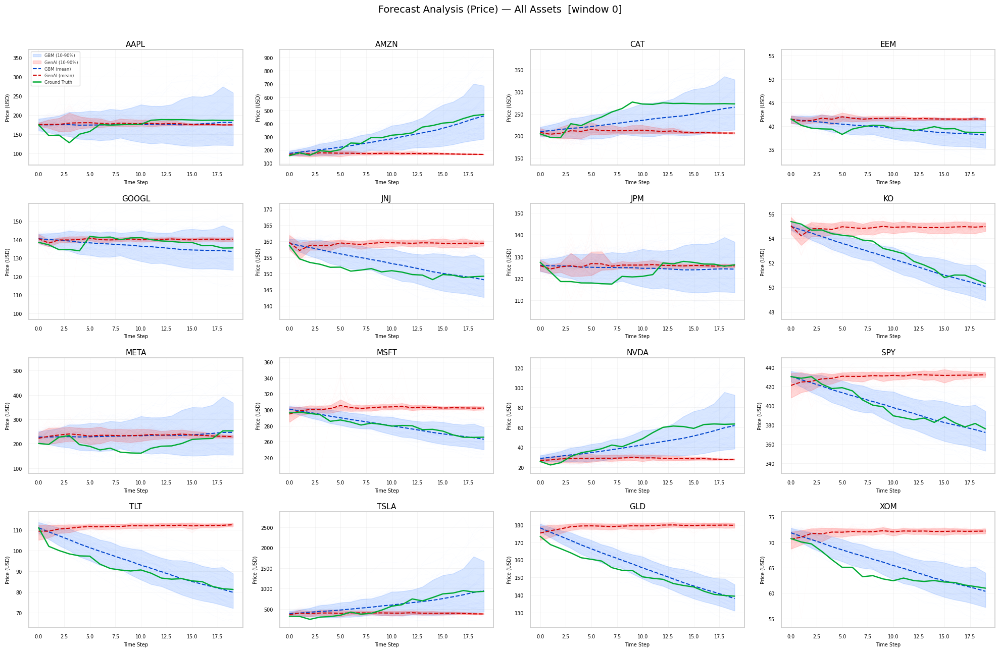

✓ Done


In [23]:
"""
Forecast Analysis (Price) — all assets, single window, white background
ใส่หลัง all_windows, SYMBOLS โหลดเรียบร้อยแล้ว
"""

import numpy as np
import matplotlib.pyplot as plt
import math

# ─── 0. Config ────────────────────────────────────────────────────────────────
WINDOW_IDX   = 0
N_PATHS_VIZ  = 300
ALPHA_PATH   = 0.03
CI_LO, CI_HI = 10, 90

# ─── 1. ดึงข้อมูล window เดียว ────────────────────────────────────────────────
w        = all_windows[WINDOW_IDX]
N_ASSETS = len(SYMBOLS)

# ─── 2. Plot grid ─────────────────────────────────────────────────────────────
NCOLS = 4
NROWS = math.ceil(N_ASSETS / NCOLS)

fig, axes = plt.subplots(NROWS, NCOLS,
                         figsize=(NCOLS * 5, NROWS * 3.2),
                         facecolor="white")
axes = axes.flatten()

for a_idx, symbol in enumerate(SYMBOLS):
    ax = axes[a_idx]
    ax.set_facecolor("white")

    init_p = float(w["init_price"][a_idx])

    # GT prices
    lr_gt = w["log_returns"][0, a_idx, :, 0, 0]         # (W,)
    gt_p  = init_p * np.exp(np.cumsum(lr_gt))            # (W,)

    # GenAI prices
    n      = min(N_PATHS_VIZ, w["prices"].shape[0])
    genai  = w["prices"][:n, a_idx, :, 0]               # (n, W)

    # GBM — fit จาก GT lr ของ window นี้ (เหมือนเดิม แค่ visualize ไปก่อน)
    mu, sigma = lr_gt.mean(), max(lr_gt.std(), 1e-4)
    rng    = np.random.default_rng(42)
    noise  = rng.normal(mu, sigma, size=(n, len(lr_gt)))
    gbm    = init_p * np.exp(np.cumsum(noise, axis=1))   # (n, W)

    t = np.arange(len(gt_p))

    # paths
    for j in range(n):
        ax.plot(t, gbm[j],   color="#4488FF", alpha=ALPHA_PATH, linewidth=0.3)
    for j in range(n):
        ax.plot(t, genai[j], color="#FF4444", alpha=ALPHA_PATH, linewidth=0.3)

    # CI bands
    ax.fill_between(t,
                    np.percentile(gbm,   CI_LO, axis=0),
                    np.percentile(gbm,   CI_HI, axis=0),
                    alpha=0.2, color="#4488FF",
                    label=f"GBM ({CI_LO}-{CI_HI}%)")
    ax.fill_between(t,
                    np.percentile(genai, CI_LO, axis=0),
                    np.percentile(genai, CI_HI, axis=0),
                    alpha=0.2, color="#FF4444",
                    label=f"GenAI ({CI_LO}-{CI_HI}%)")

    # mean lines
    ax.plot(t, gbm.mean(axis=0),   color="#0044CC", lw=1.5, ls="--", label="GBM (mean)",   zorder=5)
    ax.plot(t, genai.mean(axis=0), color="#CC0000", lw=1.5, ls="--", label="GenAI (mean)", zorder=5)

    # ground truth
    ax.plot(t, gt_p, color="#00AA33", lw=1.8, label="Ground Truth", zorder=6)

    ax.set_title(symbol, fontsize=11, color="black", pad=4)
    ax.tick_params(colors="black", labelsize=7)
    ax.set_xlabel("Time Step", fontsize=7, color="black")
    ax.set_ylabel("Price (USD)", fontsize=7, color="black")
    for spine in ax.spines.values():
        spine.set_edgecolor("#cccccc")
    ax.grid(alpha=0.3, color="#cccccc")

    # legend เฉพาะ subplot แรก
    if a_idx == 0:
        ax.legend(loc="upper left", fontsize=6, framealpha=0.8)

# ซ่อน axes ที่เกิน
for i in range(N_ASSETS, len(axes)):
    axes[i].set_visible(False)

fig.suptitle(f"Forecast Analysis (Price) — All Assets  [window {WINDOW_IDX}]",
             fontsize=14, color="black", y=1.01)

plt.tight_layout()
plt.savefig("forecast_analysis_all_assets.png", dpi=150,
            bbox_inches="tight", facecolor="white")
plt.show()
print("✓ Done")

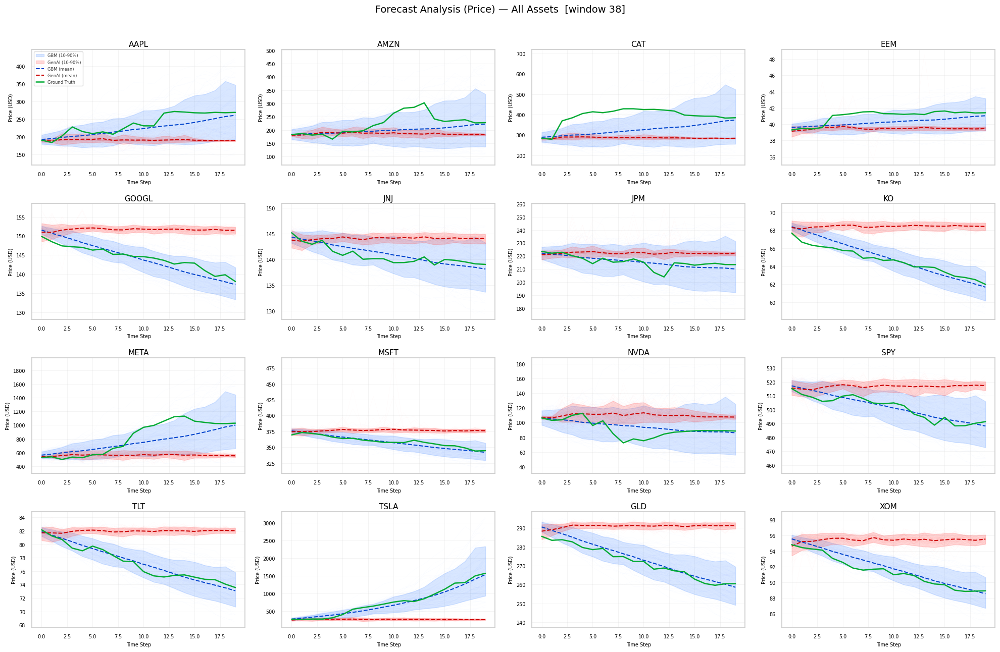

✓ Done


In [24]:
"""
Forecast Analysis (Price) — all assets, single window, white background
ใส่หลัง all_windows, SYMBOLS โหลดเรียบร้อยแล้ว
"""

import numpy as np
import matplotlib.pyplot as plt
import math

# ─── 0. Config ────────────────────────────────────────────────────────────────
WINDOW_IDX   = 38
N_PATHS_VIZ  = 300
ALPHA_PATH   = 0.03
CI_LO, CI_HI = 10, 90

# ─── 1. ดึงข้อมูล window เดียว ────────────────────────────────────────────────
w        = all_windows[WINDOW_IDX]
N_ASSETS = len(SYMBOLS)

# ─── 2. Plot grid ─────────────────────────────────────────────────────────────
NCOLS = 4
NROWS = math.ceil(N_ASSETS / NCOLS)

fig, axes = plt.subplots(NROWS, NCOLS,
                         figsize=(NCOLS * 5, NROWS * 3.2),
                         facecolor="white")
axes = axes.flatten()

for a_idx, symbol in enumerate(SYMBOLS):
    ax = axes[a_idx]
    ax.set_facecolor("white")

    init_p = float(w["init_price"][a_idx])

    # GT prices
    lr_gt = w["log_returns"][0, a_idx, :, 0, 0]         # (W,)
    gt_p  = init_p * np.exp(np.cumsum(lr_gt))            # (W,)

    # GenAI prices
    n      = min(N_PATHS_VIZ, w["prices"].shape[0])
    genai  = w["prices"][:n, a_idx, :, 0]               # (n, W)

    # GBM — fit จาก GT lr ของ window นี้ (เหมือนเดิม แค่ visualize ไปก่อน)
    mu, sigma = lr_gt.mean(), max(lr_gt.std(), 1e-4)
    rng    = np.random.default_rng(42)
    noise  = rng.normal(mu, sigma, size=(n, len(lr_gt)))
    gbm    = init_p * np.exp(np.cumsum(noise, axis=1))   # (n, W)

    t = np.arange(len(gt_p))

    # paths
    for j in range(n):
        ax.plot(t, gbm[j],   color="#4488FF", alpha=ALPHA_PATH, linewidth=0.3)
    for j in range(n):
        ax.plot(t, genai[j], color="#FF4444", alpha=ALPHA_PATH, linewidth=0.3)

    # CI bands
    ax.fill_between(t,
                    np.percentile(gbm,   CI_LO, axis=0),
                    np.percentile(gbm,   CI_HI, axis=0),
                    alpha=0.2, color="#4488FF",
                    label=f"GBM ({CI_LO}-{CI_HI}%)")
    ax.fill_between(t,
                    np.percentile(genai, CI_LO, axis=0),
                    np.percentile(genai, CI_HI, axis=0),
                    alpha=0.2, color="#FF4444",
                    label=f"GenAI ({CI_LO}-{CI_HI}%)")

    # mean lines
    ax.plot(t, gbm.mean(axis=0),   color="#0044CC", lw=1.5, ls="--", label="GBM (mean)",   zorder=5)
    ax.plot(t, genai.mean(axis=0), color="#CC0000", lw=1.5, ls="--", label="GenAI (mean)", zorder=5)

    # ground truth
    ax.plot(t, gt_p, color="#00AA33", lw=1.8, label="Ground Truth", zorder=6)

    ax.set_title(symbol, fontsize=11, color="black", pad=4)
    ax.tick_params(colors="black", labelsize=7)
    ax.set_xlabel("Time Step", fontsize=7, color="black")
    ax.set_ylabel("Price (USD)", fontsize=7, color="black")
    for spine in ax.spines.values():
        spine.set_edgecolor("#cccccc")
    ax.grid(alpha=0.3, color="#cccccc")

    # legend เฉพาะ subplot แรก
    if a_idx == 0:
        ax.legend(loc="upper left", fontsize=6, framealpha=0.8)

# ซ่อน axes ที่เกิน
for i in range(N_ASSETS, len(axes)):
    axes[i].set_visible(False)

fig.suptitle(f"Forecast Analysis (Price) — All Assets  [window {WINDOW_IDX}]",
             fontsize=14, color="black", y=1.01)

plt.tight_layout()
plt.savefig("forecast_analysis_all_assets.png", dpi=150,
            bbox_inches="tight", facecolor="white")
plt.show()
print("✓ Done")

History steps : 460,  Forecast steps: 460


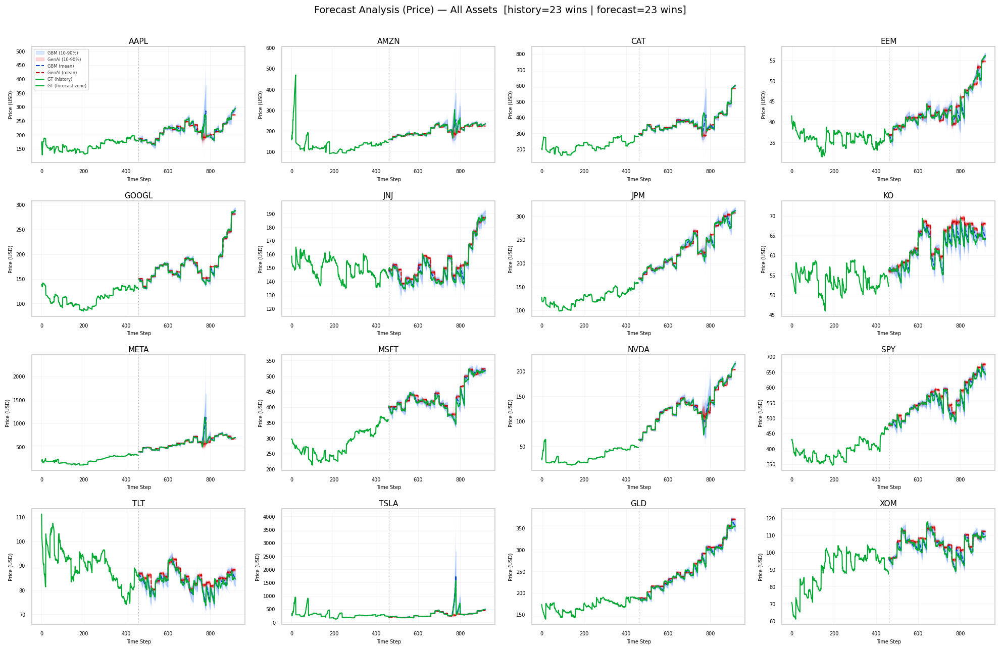

✓ Done


In [25]:
"""
Forecast Analysis (Price) — ต่อ windows + all assets grid, white background
ใส่หลัง all_windows, SYMBOLS โหลดเรียบร้อยแล้ว
"""

import numpy as np
import matplotlib.pyplot as plt
import math

# ─── 0. Config ────────────────────────────────────────────────────────────────
N_PATHS_VIZ  = 300
ALPHA_PATH   = 0.03
CI_LO, CI_HI = 10, 90
HISTORY_WINS = max(1, len(all_windows) // 2)   # ครึ่งแรก = history

# ─── 1. Helpers ───────────────────────────────────────────────────────────────
def get_gt_prices(window, asset_idx):
    lr     = window["log_returns"][0, asset_idx, :, 0, 0]
    init_p = float(window["init_price"][asset_idx])
    return init_p * np.exp(np.cumsum(lr))          # (W,)

def get_genai_prices(window, asset_idx, n_paths):
    n = min(n_paths, window["prices"].shape[0])
    return window["prices"][:n, asset_idx, :, 0]   # (n, W)

def simulate_gbm(init_price, lr_gt, n_paths, seed=42):
    mu, sigma = lr_gt.mean(), max(lr_gt.std(), 1e-4)
    rng   = np.random.default_rng(seed)
    noise = rng.normal(mu, sigma, size=(n_paths, len(lr_gt)))
    return init_price * np.exp(np.cumsum(noise, axis=1))  # (n, W)

# ─── 2. Pre-stitch ทุก asset ──────────────────────────────────────────────────
N_WIN    = len(all_windows)
N_ASSETS = len(SYMBOLS)

data = {}   # { asset_idx: { hist, gt_fcast, genai, gbm, H, F } }

for a_idx in range(N_ASSETS):
    # History
    hist_parts = [get_gt_prices(all_windows[i], a_idx)
                  for i in range(HISTORY_WINS)]
    hist_arr = np.concatenate(hist_parts)

    # Forecast
    gt_parts, genai_parts, gbm_parts = [], [], []
    for i in range(HISTORY_WINS, N_WIN):
        w      = all_windows[i]
        gt_p   = get_gt_prices(w, a_idx)
        genai_p = get_genai_prices(w, a_idx, N_PATHS_VIZ)
        lr_gt  = w["log_returns"][0, a_idx, :, 0, 0]
        init_p = float(w["init_price"][a_idx])
        gbm_p  = simulate_gbm(init_p, lr_gt, genai_p.shape[0], seed=42+i)

        gt_parts.append(gt_p)
        genai_parts.append(genai_p)
        gbm_parts.append(gbm_p)

    data[a_idx] = {
        "hist"     : hist_arr,
        "gt_fcast" : np.concatenate(gt_parts),
        "genai"    : np.concatenate(genai_parts, axis=1),
        "gbm"      : np.concatenate(gbm_parts,   axis=1),
    }

H = len(data[0]["hist"])
F = len(data[0]["gt_fcast"])
t_hist  = np.arange(H)
t_fcast = np.arange(H, H + F)

print(f"History steps : {H},  Forecast steps: {F}")

# ─── 3. Plot grid ─────────────────────────────────────────────────────────────
NCOLS = 4
NROWS = math.ceil(N_ASSETS / NCOLS)

fig, axes = plt.subplots(NROWS, NCOLS,
                         figsize=(NCOLS * 5, NROWS * 3.2),
                         facecolor="white")
axes = axes.flatten()

for a_idx, symbol in enumerate(SYMBOLS):
    ax  = axes[a_idx]
    ax.set_facecolor("white")
    d   = data[a_idx]
    n   = d["genai"].shape[0]

    # paths
    for j in range(n):
        ax.plot(t_fcast, d["gbm"][j],   color="#4488FF", alpha=ALPHA_PATH, lw=0.3)
    for j in range(n):
        ax.plot(t_fcast, d["genai"][j], color="#FF4444", alpha=ALPHA_PATH, lw=0.3)

    # CI bands
    ax.fill_between(t_fcast,
                    np.percentile(d["gbm"],   CI_LO, axis=0),
                    np.percentile(d["gbm"],   CI_HI, axis=0),
                    alpha=0.2, color="#4488FF", label=f"GBM ({CI_LO}-{CI_HI}%)")
    ax.fill_between(t_fcast,
                    np.percentile(d["genai"], CI_LO, axis=0),
                    np.percentile(d["genai"], CI_HI, axis=0),
                    alpha=0.2, color="#FF4444", label=f"GenAI ({CI_LO}-{CI_HI}%)")

    # mean lines
    ax.plot(t_fcast, d["gbm"].mean(axis=0),   color="#0044CC", lw=1.5, ls="--", label="GBM (mean)",   zorder=5)
    ax.plot(t_fcast, d["genai"].mean(axis=0), color="#CC0000", lw=1.5, ls="--", label="GenAI (mean)", zorder=5)

    # ground truth history + forecast
    ax.plot(t_hist,  d["hist"],     color="#00AA33", lw=1.5, label="GT (history)",      zorder=6)
    ax.plot(t_fcast, d["gt_fcast"], color="#00AA33", lw=1.5, label="GT (forecast zone)", zorder=6)

    # divider
    ax.axvline(H, color="gray", lw=0.8, ls=":", alpha=0.7)

    ax.set_title(symbol, fontsize=11, color="black", pad=4)
    ax.tick_params(colors="black", labelsize=7)
    ax.set_xlabel("Time Step", fontsize=7, color="black")
    ax.set_ylabel("Price (USD)", fontsize=7, color="black")
    for spine in ax.spines.values():
        spine.set_edgecolor("#cccccc")
    ax.grid(alpha=0.3, color="#cccccc")

    if a_idx == 0:
        ax.legend(loc="upper left", fontsize=6, framealpha=0.8)

# ซ่อน axes ที่เกิน
for i in range(N_ASSETS, len(axes)):
    axes[i].set_visible(False)

fig.suptitle(f"Forecast Analysis (Price) — All Assets  "
             f"[history={HISTORY_WINS} wins | forecast={N_WIN - HISTORY_WINS} wins]",
             fontsize=14, color="black", y=1.005)

plt.tight_layout()
plt.savefig("forecast_analysis_stitched_all.png", dpi=150,
            bbox_inches="tight", facecolor="white")
plt.show()
print("✓ Done")

In [26]:
import numpy as np

results = []

for win_idx in range(len(all_windows)):
    w = all_windows[win_idx]
    for a_idx, symbol in enumerate(SYMBOLS):
        genai = w["prices"][:, a_idx, :, 0]          # (N, W)

        # วัด spread = mean width of 10-90 percentile band
        lo = np.percentile(genai, 10, axis=0)
        hi = np.percentile(genai, 90, axis=0)
        spread_pct = ((hi - lo) / (genai.mean() + 1e-8)).mean() * 100

        results.append((spread_pct, win_idx, a_idx, symbol))

results.sort(reverse=True)
print(f"{'spread%':>8}  {'win':>4}  {'asset'}")
print("─" * 35)
for spread, win_idx, a_idx, sym in results[:20]:
    print(f"{spread:>8.2f}%  {win_idx:>4}  {sym}")

 spread%   win  asset
───────────────────────────────────
   24.47%    38  TSLA
   24.03%     0  TSLA
   18.28%     3  TSLA
   18.13%     0  META
   17.20%     0  NVDA
   16.59%    38  META
   15.86%    38  NVDA
   13.63%     0  AMZN
   13.35%    38  AMZN
   11.41%     8  TSLA
   10.77%     3  META
    9.64%     3  NVDA
    9.32%     0  AAPL
    9.10%     3  AMZN
    9.08%    39  TSLA
    8.25%    38  AAPL
    8.12%     7  TSLA
    8.10%    11  TSLA
    7.69%     4  TSLA
    7.06%     0  CAT
